# Pulse Planning Example for DIII-D with TokaMaker+TORAX

TokaMaker solves time-independent equilibria; TORAX solves the 1-D transport equations for the kinetic/current profiles. The two are coupled in a loop.

Every input here - geometry, kinetic profiles, heating, fueling, Ip - comes from a single TRANSP run for a chosen DIII-D shot (`transp_to_torax/transp_to_torax.py`), so this models whatever real ramp-up phase that shot covers, not a designed pulse.

## Seed eqdsk creation with TokaMaker

Creates six seed equilibria (target shapes) that TokaMaker_TORAX interpolates between for the first TORAX run. Shapes come from TRANSP's own LCFS geometry (`get_geometry()`/`get_boundary_contour()`) at six real time slices spread across the file's ramp-up (no flattop/rampdown here, so all six sample one continuous ramp).

- The first equilibrium's `psi_lcfs` is critical - it seeds the TORAX psi target; later values get overwritten after the first TORAX run.
- Shapes are linearly interpolated between for all TokaMaker_TORAX timepoints and never evolve.
- TRANSP's moment-expansion boundary is a best-effort reconstruction, not an EFIT-quality one.

`shot` resolves to a TRANSP CDF file (`transp_to_torax/{shot}*.CDF`) - device geometry, seed times, and all targets below are derived from it. Swap the shot number (and CDF file) to retarget the whole notebook.

In [1]:
# Global inputs
shot = 176858  # DIII-D shot number - expects transp_to_torax/{shot}*.CDF; assumes a similarly ramp-up-only TRANSP run.

# Setup

## Setup Python environment

In [2]:
import os
import sys
import re
import glob
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
plt.rcParams['figure.figsize']=(6,6)
plt.rcParams['font.weight']='bold'
plt.rcParams['axes.labelweight']='bold'
plt.rcParams['lines.linewidth']=2
plt.rcParams['lines.markeredgewidth']=2

To load the TokaMaker python module we need to tell python where to the module is located. The best way to do this is through the `PYTHONPATH` environment variable or using a dedicated environement variable (eg. `OFT_ROOTPATH`) to provide the path to where the OpenFUSIONToolkit is installed and passing this to `sys.path.append()` as below.

It is also possible to run this script on Google Colab, which requires a few other steps including installing OFT from a binary tarball.

In [3]:
try:
    from google.colab import output
    output.enable_custom_widget_manager()
    on_google_colab = True
except:
    tokamaker_python_path = os.getenv('OFT_ROOTPATH')
    if tokamaker_python_path is not None:
        sys.path.append(os.path.join(tokamaker_python_path,'python'))
    on_google_colab = False
    pass
else:
    !pip install -q wurlitzer ipympl
    OFT_package = 'OpenFUSIONToolkit_v1.0.0-beta7-Linux-GNU-x86_64'
    OFT_tarball = 'OpenFUSIONToolkit_v1.0.0-beta7-Ubuntu_22_04-GNU-x86_64.tar.gz'
    print("Google collab detected:")
    if os.path.exists(os.path.join('/content',OFT_package,'python')):
        print("  Using existing OFT installation")
    else:
        print("  Installing OFT for GitHub")
        !wget -q https://github.com/openfusiontoolkit/OpenFUSIONToolkit/releases/download/v1.0.0-beta6/{OFT_tarball}
        !tar xzf {OFT_tarball}
    OFT_rootpath = os.path.join('/content',OFT_package)
    # 'DIIID_mesh_2025.h5' and this shot's TRANSP CDF file (transp_to_torax/{shot}*.CDF) aren't part
    # of the OFT package - upload them (plus transp_to_torax.py) to the Colab session (eg. via
    # the Files pane) before running the cells below.
    sys.path.append(os.path.join(OFT_package,'python'))
    %load_ext wurlitzer
%matplotlib inline
%config InlineBackend.figure_format = "retina"

Now that TokaMaker is installed an in our Python path we can load the required modules

In [4]:
from OpenFUSIONToolkit.TokaMaker.meshing import gs_Domain, save_gs_mesh, load_gs_mesh
from OpenFUSIONToolkit.TokaMaker import TokaMaker
from OpenFUSIONToolkit.TokaMaker.pulse_design import TokaMaker_TORAX
from OpenFUSIONToolkit import OFT_env

## Setup model

### Initialize TokaMaker object
Create an [OFT_env](https://openfusiontoolkit.github.io/OpenFUSIONToolkit/docs/v1.0.0-beta6/classOpenFUSIONToolkit_1_1__core_1_1OFT__env.html) instance (manages toolkit-wide environment, passed to physics tools like TokaMaker/ThinCurr) and a [TokaMaker](https://openfusiontoolkit.github.io/OpenFUSIONToolkit/docs/v1.0.0-beta6/classOpenFUSIONToolkit_1_1TokaMaker_1_1__core_1_1TokaMaker.html) instance for equilibrium calculations.

In [5]:
if on_google_colab:
    myOFT = OFT_env(nthreads=1)
else:
    myOFT = OFT_env(nthreads=2)
mygs = TokaMaker(myOFT)

#----------------------------------------------
Open FUSION Toolkit Initialized
Development branch:    main
Revision id:           ea6a92a
Parallelization Info:
  Not compiled with MPI
  # of OpenMP threads =    2
Integer Precisions    =    4   8
Float Precisions      =    4   8  16
Complex Precisions    =    4   8
LA backend            = native
#----------------------------------------------



### Load TRANSP data
`run` wraps the CDF via `TranspRun`; `run.get_geometry()` (`geom`) plays the role an eqdsk's `rcentr`/`rzout`/`zaxis`/`ip`/`pres`/`psibry` would, read directly from TRANSP instead (see `get_geometry`'s docstring for the exact mapping/caveats).

`n_seed=6` evenly-spaced time slices sample the ramp-up as seed-equilibrium points - a chosen resolution, not something derived from the data.

In [6]:
cwd = os.getcwd()
transp_dir = os.path.join(cwd, 'transp_to_torax')
if transp_dir not in sys.path:
    sys.path.append(transp_dir)
from transp_to_torax import TranspRun

transp_files = sorted(glob.glob(os.path.join(transp_dir, f'{shot}*.CDF')))
if not transp_files:
    raise FileNotFoundError(f"No TRANSP CDF file found for shot {shot} in {transp_dir}")
run = TranspRun(transp_files[0])
run.summary()

geom = run.get_geometry()
n_seed = 6
seed_idx = np.linspace(0, len(run.time) - 1, n_seed).round().astype(int)
seed_times = run.time[seed_idx]

def geom_at(key, j):
    '''geom[key] at the j-th selected seed time (geom's dicts are keyed by TRANSP's own time values)'''
    return geom[key][float(seed_times[j])]

print(f'Selected {n_seed} ramp-up time slices for shot {shot} at t={seed_times} s')

time range: 0.1010 - 1.5200 s (143 points)
rho grid: X has 50 zone centers (0.010-0.990), XB has 50 boundaries (0.020-1.000)
main ion fractions: {'D': 1.0}
Zeff (time-avg, vol-avg): 1.767
impurity: measured avg Z=6.00, A=12.00 -> nearest Mavrin species 'C'
Ip: 0.574 - 1.524 MA
geometry @ t=0.812s: R0_geo=1.697 m, a=0.558 m, F0=3.565 T*m, kappa=1.93 (up=2.05, lo=1.82), delta_up=0.58, delta_lo=0.31, pax=19387 Pa
heating sources present: NBI=True, ECH=False, ICH=False
  PINJ: 0.00 - 3.94 MW
fueling[gas_puff_SESGF]: S_total 9.88e-01 - 1.00e+00 particles/s, loc_avg=0.914, width_avg=0.137
fueling[recycling_SERC_D]: S_total 1.48e+18 - 1.15e+22 particles/s, loc_avg=0.899, width_avg=0.145
fueling[recycling_SERC_D_decay_length]: decay_length_avg=0.197
fueling[beam_fueling_SBE]: S_total 0.00e+00 - 2.34e+20 particles/s, loc_avg=0.399, width_avg=0.273
Selected 6 ramp-up time slices for shot 176858 at t=[0.101      0.38080001 0.67174947 0.95179719 1.24179995 1.51999998] s


### Setup TokaMaker with the device mesh
Loads the mesh (`DIIID_mesh_2025.h5`), sets up regions/coils, then calls [setup()](https://openfusiontoolkit.github.io/OpenFUSIONToolkit/docs/v1.0.0-beta6/classOpenFUSIONToolkit_1_1TokaMaker_1_1__core_1_1TokaMaker.html#aaa9d13419da15fd024f845b705ba94a8) with element order and $F_0=B_0 R_0$. $F_0$ comes from TRANSP's `BZXR` (`geom['F0']`) at the first seed time - it varies <0.3% across the file, so any seed point would work equally well.

In [7]:
mesh_pts,mesh_lc,mesh_reg,coil_dict,cond_dict = load_gs_mesh('DIIID_mesh_2025.h5')

# mygs.reset()
mygs.setup_mesh(mesh_pts, mesh_lc, mesh_reg)
mygs.setup_regions(cond_dict=cond_dict,coil_dict=coil_dict)
# F0=B0*R0, from TRANSP's own BZXR at the first selected seed time (see markdown above)
mygs.setup(order=2, F0=geom_at('F0', 0))
mygs.set_targets(Ip=geom_at('Ip', 0), pax=geom_at('pax', 0))


**** Loading OFT surface mesh

**** Generating surface grid level  1
  Generating boundary domain linkage
  Mesh statistics:
    Area         =  1.574E+01
    # of points  =   12287
    # of edges   =   36698
    # of cells   =   24412
    # of boundary points =     160
    # of boundary edges  =     160
    # of boundary cells  =     160
  Resolution statistics:
    hmin =  4.995E-05
    hrms =  4.120E-02
    hmax =  1.523E-01
  Surface grounded at vertex    1800


**** Creating Lagrange FE space
  Order  =    2
  Minlev =   -1

 Computing flux BC matrix 
 Inverting real matrix
   Time =    3.5739999999999999E-003


Coil bounds (&plusmn;1.5e12, deliberately loose to avoid solver non-convergence) are set here and reused by TokaMaker_TORAX later. `build_min_norm_coil_reg` regularizes `ECOIL`/`F` coil sets separately.

In [8]:
# Set coil bounds
coil_bounds = {key: [-1.5E12, 1.5E12] for key in mygs.coil_sets}
mygs.set_coil_bounds(coil_bounds)

# function to build regularization terms for coil currents for initial equilibrium solves.
def build_min_norm_coil_reg(mygs):
    """Mild regularization to keep currents reasonable without targeting specific coils."""
    reg_terms = []
    for name in mygs.coil_sets:
        if name.startswith('ECOIL'):
            weight = 2.E-2
        else:  # F coils
            weight = 1.E-2
        reg_terms.append(mygs.coil_reg_term({name: 1.0}, target=0.0, weight=weight))
    mygs.set_coil_reg(reg_terms=reg_terms)

$FF'$/$p'$ profiles are computed directly from TRANSP (`run.get_transp2imas_profiles_1d()` in `transp_to_torax.py`), built the same way the official [transp/transp-imas-translator](https://github.com/transp/transp-imas-translator)'s `transp2imas.f90` populates the IMAS equilibrium IDS's `profiles_1d` fields: `PMHD_IN` (total pressure - see `get_ffprime_pprime_profiles`'s docstring for why total, not thermal-only), `GFUN*BZXR` ($F=R B_t$; `GFUN` alone is a boundary-normalized diamagnetic function, not $F$ itself), and **`PLFLX2PI`** for $\psi$.

**Convention change from the previous `get_ffprime_pprime_profiles()`-based cell:** the official translator reads TRANSP's `PLFLX2PI` ("TOTAL POLOIDAL FLUX", units WEBERS) for `profiles_1d.psi`, not `PLFLX` ("POLOIDAL FLUX", units Wb/rad) that the earlier cell used - confirmed empirically on a sample CDF, `PLFLX2PI == 2*pi*PLFLX` to 6 significant figures at every point. `psi_norm` (TokaMaker's `set_profiles` x-grid below) is unaffected, since that `2*pi` cancels in the axis-to-edge ratio, but `dpressure_dpsi`/`f_df_dpsi` (the y-values TokaMaker actually solves with) are now a factor of `2*pi` *smaller* than before at the same physical point.

**This specific combination has not been through the PCUR/reconstructed-$I_p$ validation** that the `PLFLX`-based profiles passed (see `get_ffprime_pprime_profiles`'s docstring) - treat the TokaMaker-vs-TRANSP $q_0$/$l_i$/$I_p$ comparison further down as the first real check of this convention, not a settled fact. If those numbers look off by a factor connected to $2\pi$, this is the first place to look.

Cross-referenced against [`imas2transp/imas-eq-q.py`](https://github.com/transp/transp-imas-translator/blob/665bd11809767f7ce3a03fd8e3327b1000dc36b5/imas2transp/imas-eq-q.py#L33), which validates exactly `profiles_1d.dpressure_dpsi` (and `.f_df_dpsi`) against TRANSP's own `fort.313`/`fort.314` dumps - see the [IMAS data dictionary](https://imas-data-dictionary.readthedocs.io/en/latest/generated/ids/equilibrium.html#equilibrium-time_slice-profiles_1d-psi) for the `psi` field this feeds.

In [9]:
# FF'/p' profiles built directly from TRANSP's CDF as IMAS's
# equilibrium.time_slice.profiles_1d fields (psi, pressure, dpressure_dpsi,
# f, f_df_dpsi) - transp_to_torax.py's get_transp2imas_profiles_1d(),
# matching the same CDF-variable choices and derivative construction as the
# official transp/transp-imas-translator's transp2imas.f90 (see markdown
# above for the PLFLX vs PLFLX2PI finding this method is built on).
#
# psi_norm is still what's passed as TokaMaker's set_profiles() x-grid below
# (dimensionless, native per seed time - same axis-dense-grid reasoning as
# before), but pp_prof_list/ffp_prof_list (dpressure_dpsi/f_df_dpsi) are now
# on transp2imas's PLFLX2PI/Weber psi convention rather than the
# PCUR-validated PLFLX/Wb-per-rad convention the previous cell used - a
# factor of 2*pi smaller than before at the same physical point. Re-check
# get_reconstructed_Ip-style validation (or the seed-equilibrium-vs-TRANSP
# comparison below) against this convention before trusting q_0/l_i/I_p from
# here on.
transp2imas_profiles_seed = run.get_transp2imas_profiles_1d()
psi_sample_list = [transp2imas_profiles_seed[float(seed_times[j])]['psi_norm'] for j in range(n_seed)]
ffp_prof_list = [transp2imas_profiles_seed[float(seed_times[j])]['f_df_dpsi'] for j in range(n_seed)]
pp_prof_list = [transp2imas_profiles_seed[float(seed_times[j])]['dpressure_dpsi'] for j in range(n_seed)]

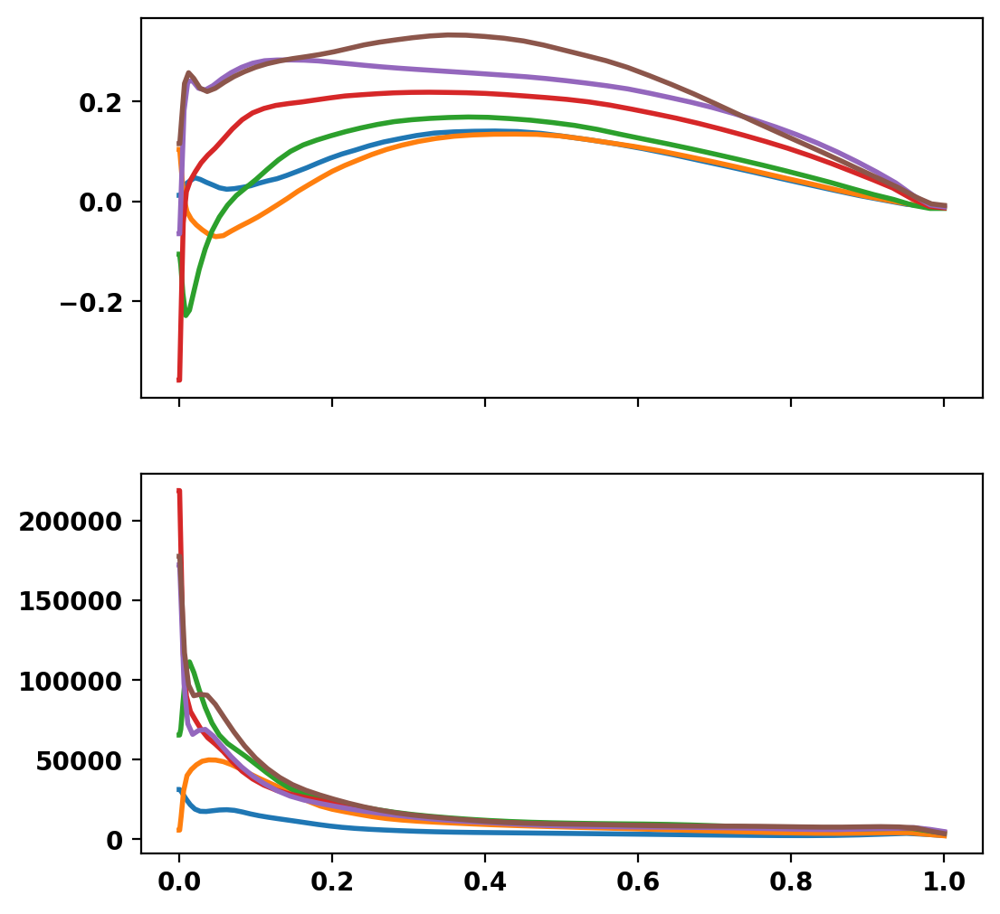

In [49]:
fig, axs = plt.subplots(2, 1, sharex=True)

for i in range(len(psi_sample_list)):

    axs[0].plot(psi_sample_list[i], ffp_prof_list[i])
    axs[1].plot(psi_sample_list[i], pp_prof_list[i])

`Ip_targets`/`pax_targets` are read directly from `geom['Ip']`/`geom['pax']` at each seed time - real values, no synthetic heuristics needed.

In [10]:
Ip_targets = [geom_at('Ip', j) for j in range(n_seed)]
pax_targets = [geom_at('pax', j) for j in range(n_seed)]

Shape targets (`r0_list`/`a_list`/`kappa_list`/`delta_list`/`psi_lcfs_list`) come straight from `geom` at each seed time - TRANSP's own LCFS center/minor radius/elongation/triangularity/enclosed flux.

`psi_lcfs_list` (TRANSP's `PLFLXA`) is sign-corrected in `get_geometry()` to match TokaMaker's COCOS convention (verified 2026-08-19 against a real coupled run - see `get_geometry()`'s "Sign convention" docstring note), but is still only a sign fix, not a gauge/offset fix, so it's only used as a soft constraint.

No X-point/diverted treatment: `get_geometry` has no X-point location, so every point fits a smooth isoflux boundary to the real contour (`get_boundary_contour`). Without a saddle constraint, an X-point-like corner would only be approximated, not reproduced exactly.

In [11]:
r0_list = [geom_at('R0_geo', j) for j in range(n_seed)]
z_list = [geom_at('Z_axis', j) for j in range(n_seed)]
a_list = [geom_at('a', j) for j in range(n_seed)]
kappa_list = [geom_at('kappa', j) for j in range(n_seed)]
delta_list = [(geom_at('delta_upper', j) + geom_at('delta_lower', j)) / 2.0 for j in range(n_seed)]
psi_lcfs_list = [geom_at('psi_lcfs', j) for j in range(n_seed)]

# Real reconstructed LCFS contour, used directly as isoflux constraint points (see markdown
# above). ntheta=100: triangularity depends on tip curvature, which a coarser sample under-resolves.
isoflux_pts_list = [run.get_boundary_contour(idx, ntheta=100) for idx in seed_idx]

# kappa/delta implied by that same contour (same extrema formula get_stats() uses) - the
# actual fit target, which can disagree with kappa_list/delta_list (TRANSP's direct ELONG/
# TRIANGU/TRIANGL) by more than get_geometry's ~1-2% cross-check figure.
def _contour_kappa_delta(contour):
    R, Z = contour[:, 0], contour[:, 1]
    Rmax, Rmin, Zmax, Zmin = R.max(), R.min(), Z.max(), Z.min()
    a_c = (Rmax - Rmin) / 2.0
    R0_c = (Rmax + Rmin) / 2.0
    kappa_c = (Zmax - Zmin) / (2 * a_c)
    delta_c = ((R0_c - R[np.argmax(Z)]) + (R0_c - R[np.argmin(Z)])) / (2 * a_c)
    return kappa_c, delta_c

kappa_contour_list, delta_contour_list = zip(*[_contour_kappa_delta(c) for c in isoflux_pts_list])

Produces the six seed equilibria and saves each as a `.eqdsk` for TokaMaker_TORAX. Each point isoflux-fits `isoflux_pts_list[idx]` with a soft `psi_lcfs_list[idx]` constraint, solves with `Ip_targets`/`pax_targets` and the generic profile shape, and seeds `init_psi` from that point's own `r0`/`z`/`a`/`kappa`/`delta`.

**`maxits`/`nl_tol`:** the nonlinear residual plateaus above the library default `1e-6` at this mesh resolution - genuinely converged, just discretization-limited - so `nl_tol=1e-3`/`maxits=100` reflect that.

**LCFS check:** each iteration plots the TRANSP-derived input contour against `mygs.trace_surf(1.0)`'s actual solved LCFS - a direct sanity check that the TRANSP geometry is physically sane and the solver reproduced it. Some deviation is expected since the fit is soft, not exact.

Starting non-linear GS solver
     1  1.2234E+01  9.1284E-06  1.3539E-02  1.7173E+00 -1.2459E-02 -0.0000E+00
     2  1.3101E+01  7.7232E-06  4.8423E-03  1.7122E+00 -1.2250E-02 -0.0000E+00
     3  1.3081E+01  7.6935E-06  1.2279E-03  1.7115E+00 -1.2206E-02 -0.0000E+00
     4  1.2966E+01  7.7524E-06  5.3196E-04  1.7114E+00 -1.2146E-02 -0.0000E+00
 Timing:   5.6845999992219731E-002
   Source:     2.1507000026758760E-002
   Solve:      1.7139000003226101E-002
   Boundary:   1.4030000602360815E-003
   Other:      1.6796999901998788E-002
idx=0  t=0.1010 s
      target psi_lcfs = -0.09 Wb/rad
      solved psi_lcfs = -0.09 Wb/rad  (-0.5 Wb)


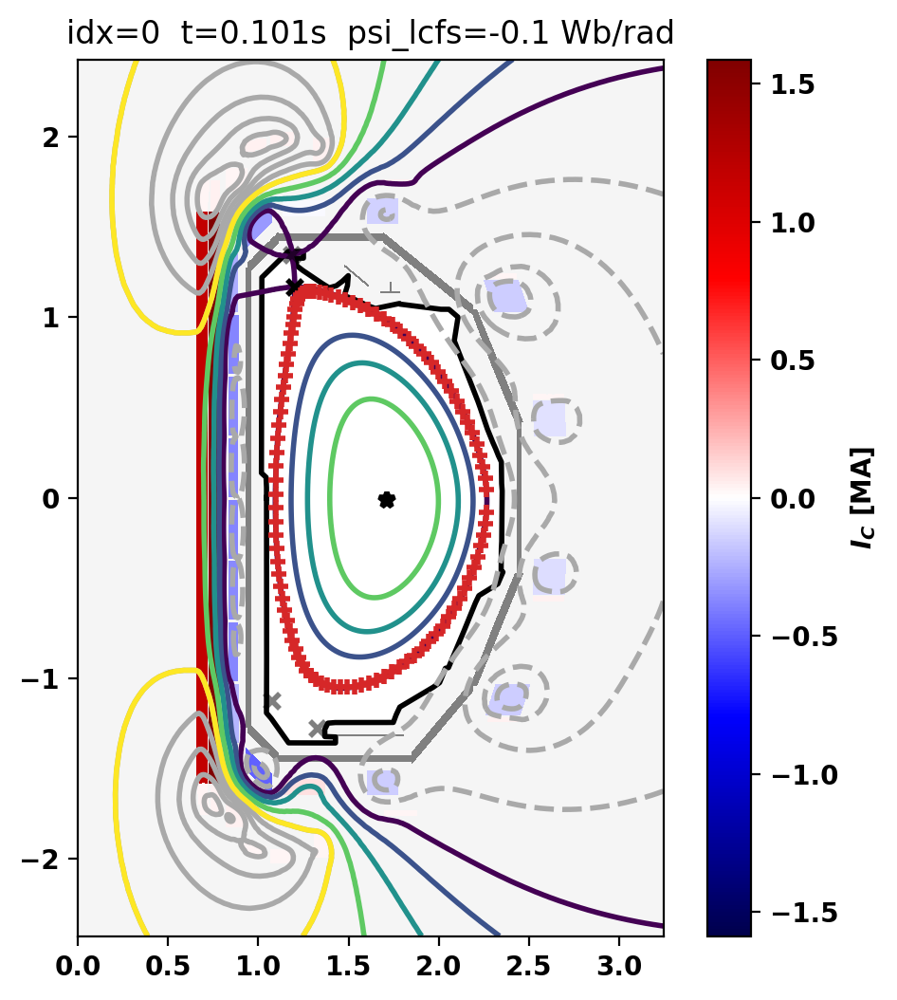

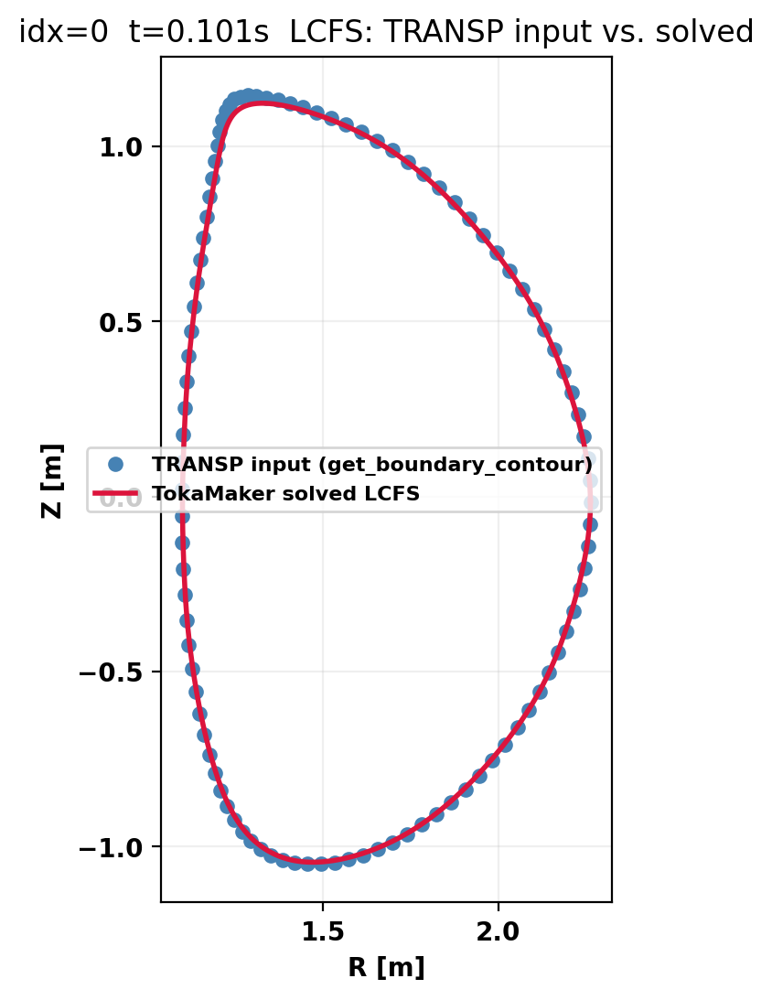

Saving gEQDSK: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/i=0.eqdsk
 Using COCOS=2...
Equilibrium Statistics:
  Topology                =   Diverted
  Toroidal Current [A]    =    5.7494E+05
  Current Centroid [m]    =    1.612  0.004
  Magnetic Axis [m]       =    1.711 -0.012
  Elongation              =    1.894 (U:  2.010, L:  1.778)
  Triangularity           =    0.590 (U:  0.807, L:  0.373)
  Plasma Volume [m^3]     =   19.954
  q_0, q_95               =    6.153 11.123
  Plasma Pressure [Pa]    =   Axis:  3.3251E+03, Peak:  3.3251E+03
  Stored Energy [J]       =    3.0660E+04
  <Beta_pol> [%]          =   15.1047
  <Beta_tor> [%]          =    0.0572
  <Beta_n>   [%]          =    0.1237
  Diamagnetic flux [Wb]   =    6.4923E-03
  Toroidal flux [Wb]      =    4.4809E+00
  l_i                     =    0.7193
Starting non-linear GS solver
     1  1.0902E+01  9.4012E-06  1.0694E-02  1.7441E+00 -2.4113E-02 -0.0000E+00
     2  1.3524E+

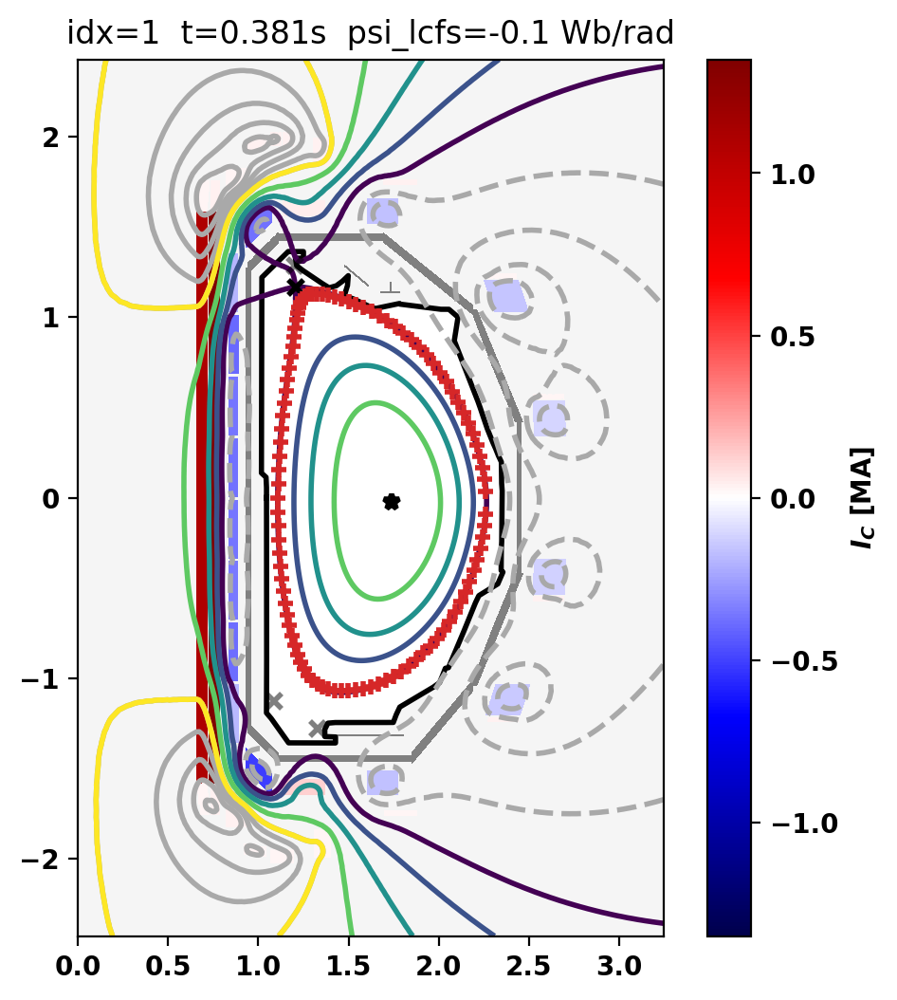

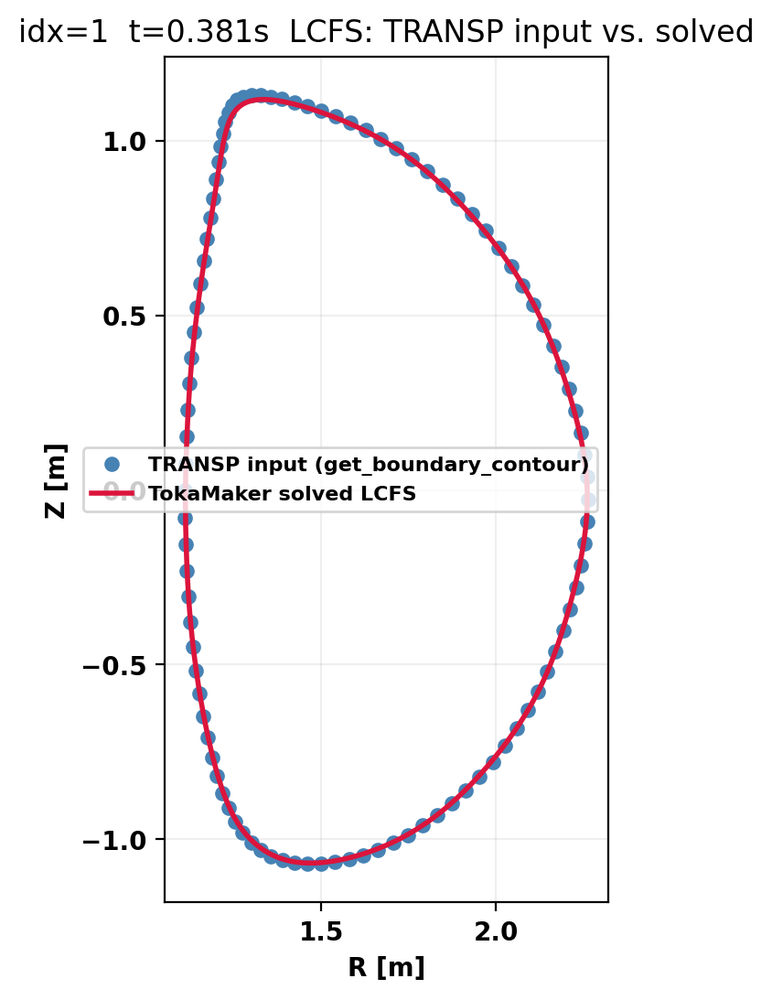

Saving gEQDSK: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/i=1.eqdsk
 Using COCOS=2...
Equilibrium Statistics:
  Topology                =   Diverted
  Toroidal Current [A]    =    6.2983E+05
  Current Centroid [m]    =    1.633 -0.011
  Magnetic Axis [m]       =    1.741 -0.024
  Elongation              =    1.940 (U:  2.059, L:  1.820)
  Triangularity           =    0.610 (U:  0.827, L:  0.393)
  Plasma Volume [m^3]     =   20.101
  q_0, q_95               =    5.954 10.182
  Plasma Pressure [Pa]    =   Axis:  8.2970E+03, Peak:  8.2970E+03
  Stored Energy [J]       =    6.7658E+04
  <Beta_pol> [%]          =   28.0858
  <Beta_tor> [%]          =    0.1262
  <Beta_n>   [%]          =    0.2452
  Diamagnetic flux [Wb]   =    6.6441E-03
  Toroidal flux [Wb]      =    4.4658E+00
  l_i                     =    0.7301
Starting non-linear GS solver
     1  8.5650E+00  1.0746E-05  1.0842E-02  1.7580E+00 -4.3713E-02 -0.0000E+00
     2  1.4539E+

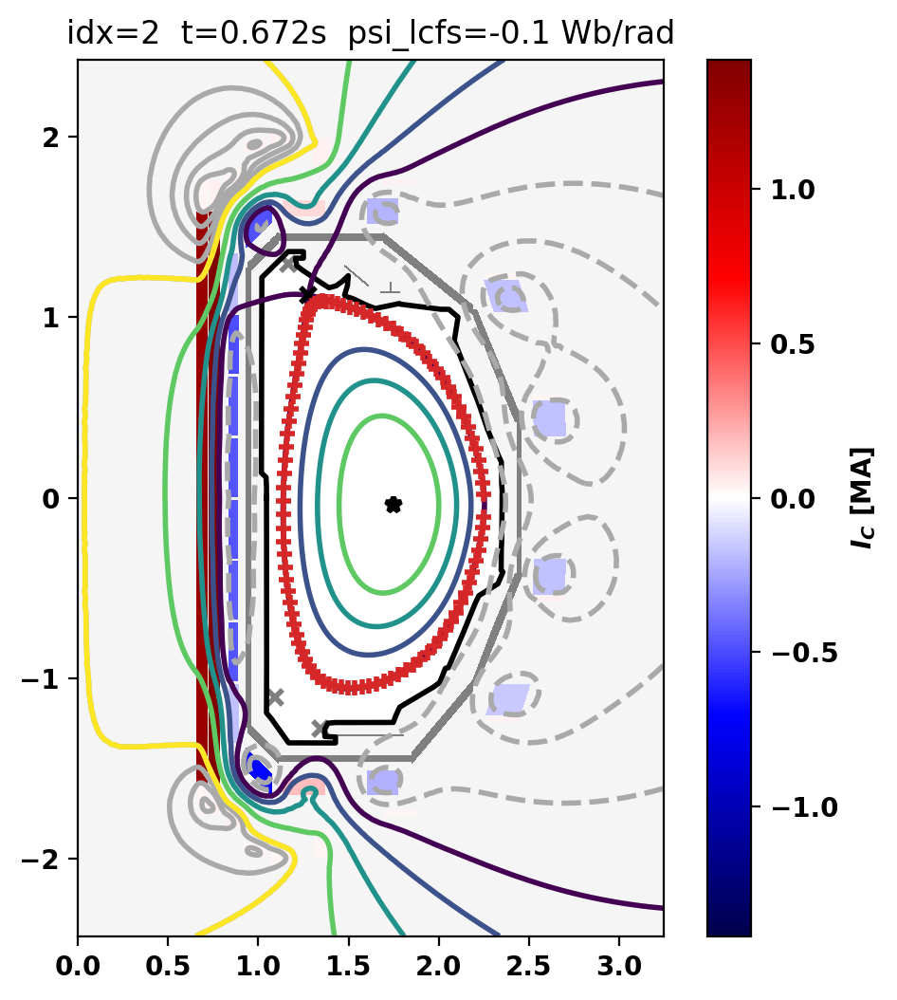

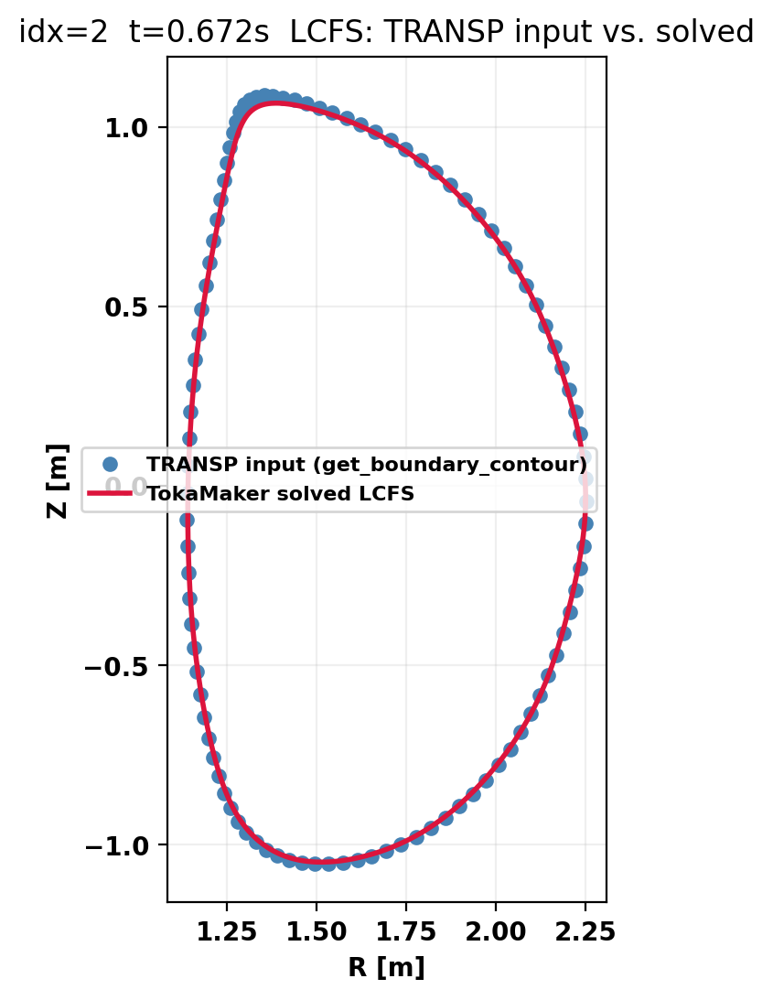

Saving gEQDSK: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/i=2.eqdsk
 Using COCOS=2...
Equilibrium Statistics:
  Topology                =   Diverted
  Toroidal Current [A]    =    8.1268E+05
  Current Centroid [m]    =    1.660 -0.031
  Magnetic Axis [m]       =    1.747 -0.041
  Elongation              =    1.995 (U:  2.081, L:  1.909)
  Triangularity           =    0.913 (U:  0.747, L:  1.078)
  Plasma Volume [m^3]     =   19.177
  q_0, q_95               =    4.459  7.096
  Plasma Pressure [Pa]    =   Axis:  1.7577E+04, Peak:  1.7577E+04
  Stored Energy [J]       =    1.2998E+05
  <Beta_pol> [%]          =   31.5229
  <Beta_tor> [%]          =    0.2568
  <Beta_n>   [%]          =    0.3708
  Diamagnetic flux [Wb]   =    1.0848E-02
  Toroidal flux [Wb]      =    4.1564E+00
  l_i                     =    0.8179
Starting non-linear GS solver
     1  9.6174E+00  1.0896E-05  7.8902E-03  1.7439E+00 -4.6593E-02 -0.0000E+00
     2  1.3389E+

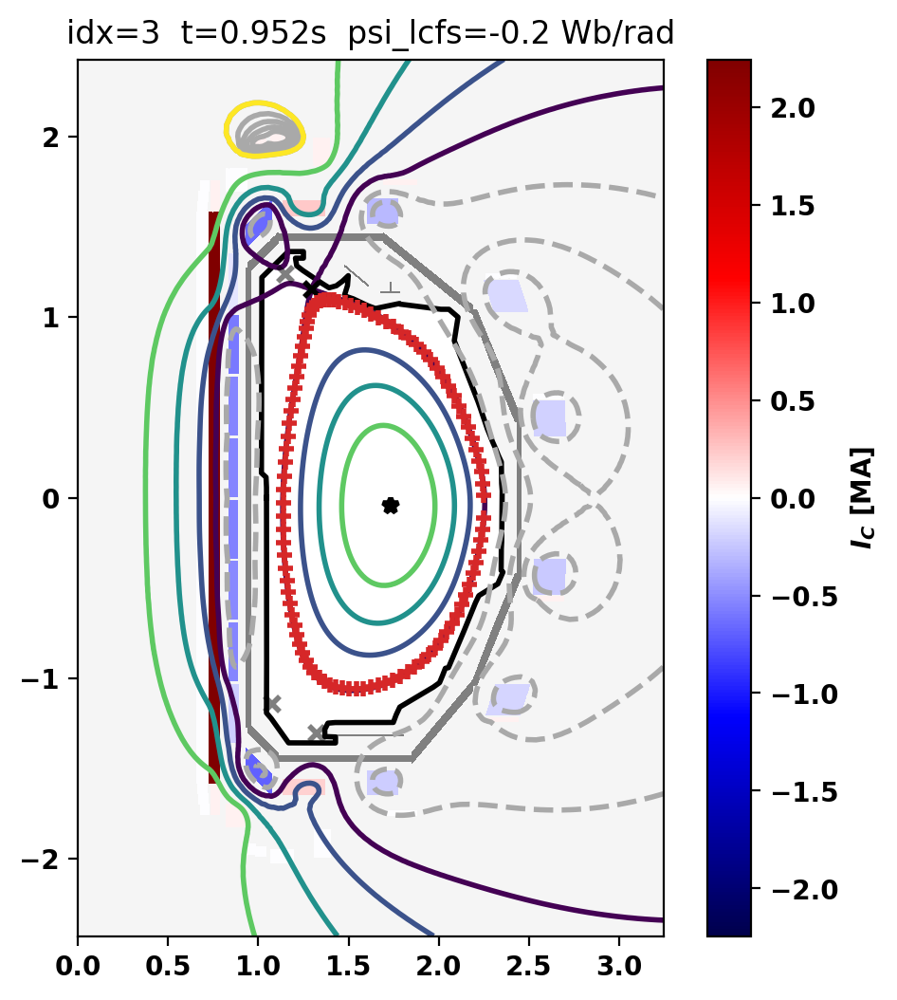

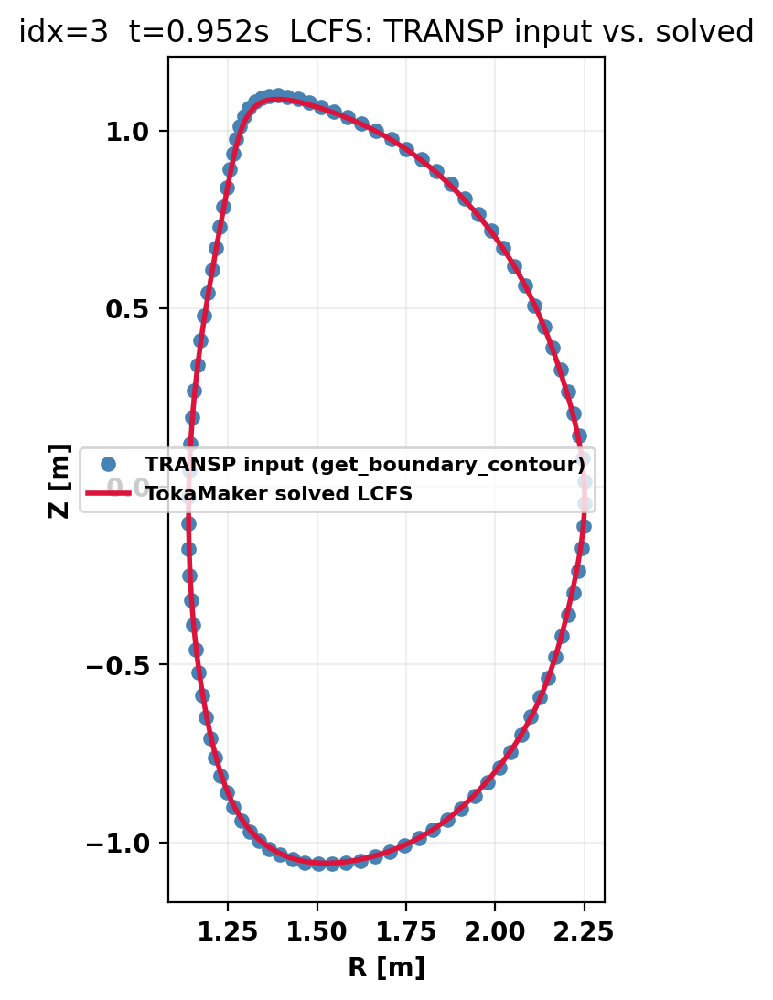

Saving gEQDSK: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/i=3.eqdsk
 Using COCOS=2...
Equilibrium Statistics:
  Topology                =   Diverted
  Toroidal Current [A]    =    1.1034E+06
  Current Centroid [m]    =    1.652 -0.032
  Magnetic Axis [m]       =    1.733 -0.046
  Elongation              =    2.048 (U:  2.142, L:  1.955)
  Triangularity           =    0.909 (U:  0.711, L:  1.108)
  Plasma Volume [m^3]     =   19.489
  q_0, q_95               =    2.056  5.252
  Plasma Pressure [Pa]    =   Axis:  2.1846E+04, Peak:  2.1846E+04
  Stored Energy [J]       =    1.5384E+05
  <Beta_pol> [%]          =   20.3641
  <Beta_tor> [%]          =    0.2990
  <Beta_n>   [%]          =    0.3191
  Diamagnetic flux [Wb]   =    2.2688E-02
  Toroidal flux [Wb]      =    4.2249E+00
  l_i                     =    0.8153
Starting non-linear GS solver
     1  9.6738E+00  1.1482E-05  1.2630E-02  1.7401E+00 -6.2765E-02 -0.0000E+00
     2  1.3108E+

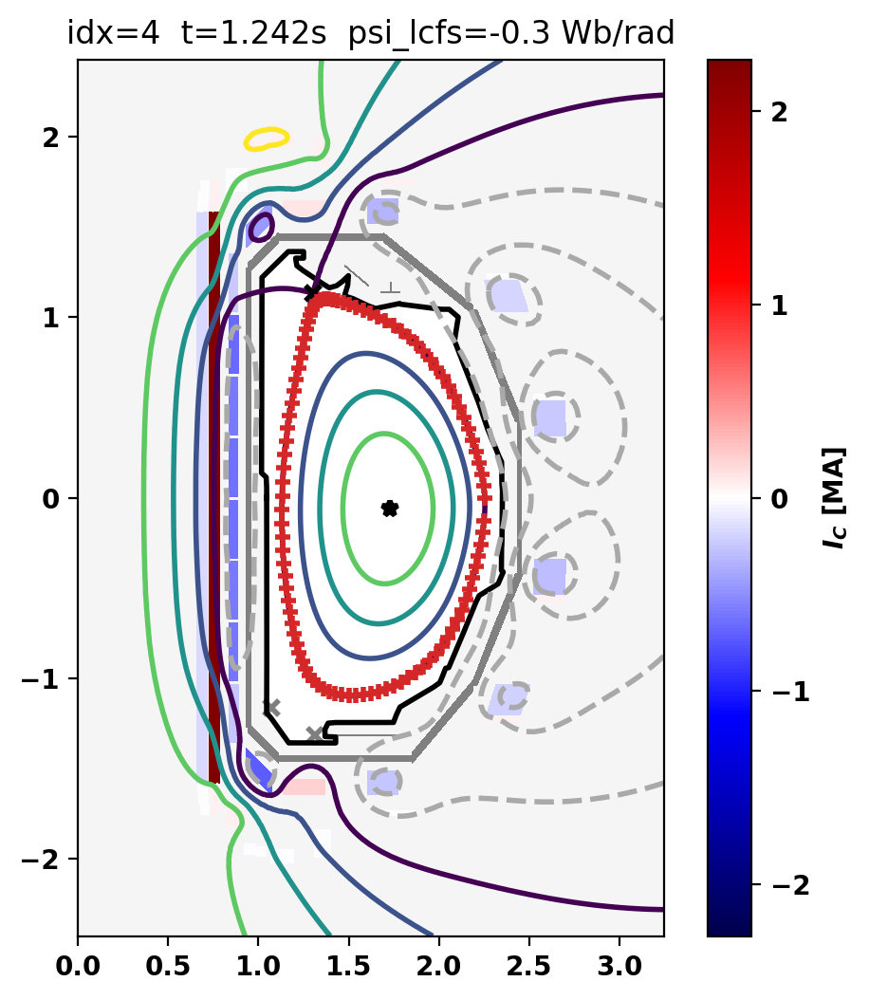

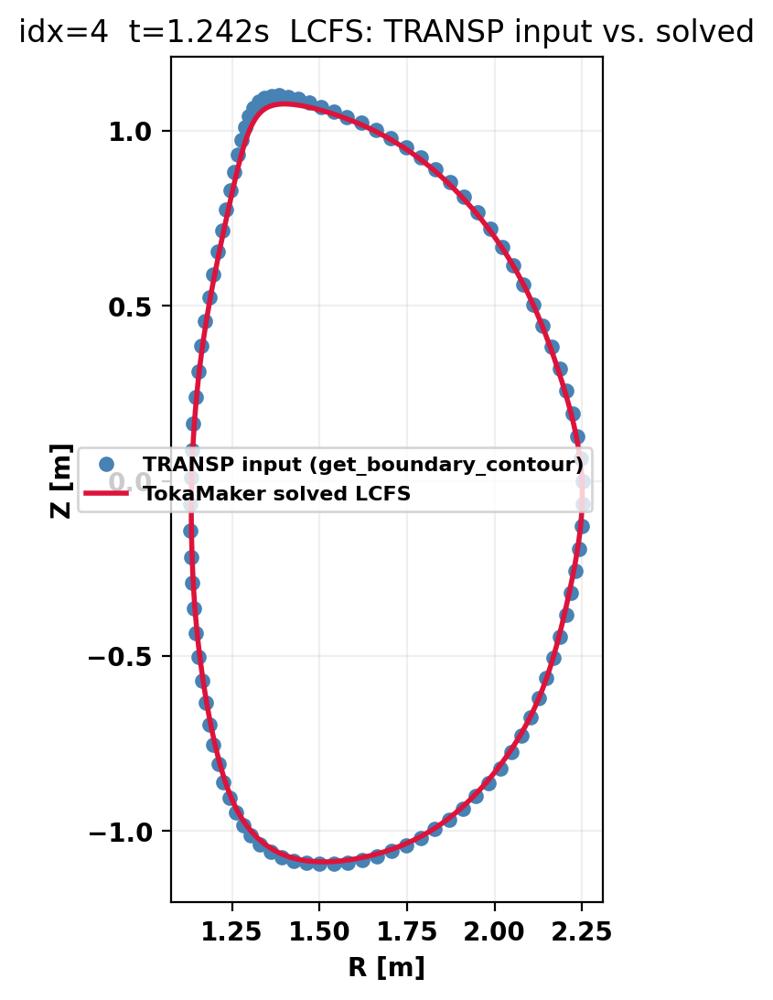

Saving gEQDSK: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/i=4.eqdsk
 Using COCOS=2...
Equilibrium Statistics:
  Topology                =   Diverted
  Toroidal Current [A]    =    1.3499E+06
  Current Centroid [m]    =    1.648 -0.051
  Magnetic Axis [m]       =    1.727 -0.062
  Elongation              =    2.042 (U:  2.128, L:  1.957)
  Triangularity           =    0.896 (U:  0.692, L:  1.101)
  Plasma Volume [m^3]     =   19.815
  q_0, q_95               =    1.425  4.365
  Plasma Pressure [Pa]    =   Axis:  2.6805E+04, Peak:  2.6805E+04
  Stored Energy [J]       =    1.7961E+05
  <Beta_pol> [%]          =   15.8542
  <Beta_tor> [%]          =    0.3421
  <Beta_n>   [%]          =    0.3002
  Diamagnetic flux [Wb]   =    3.5430E-02
  Toroidal flux [Wb]      =    4.3162E+00
  l_i                     =    0.8310
Starting non-linear GS solver
     1  9.1386E+00  1.1768E-05  1.3188E-02  1.7163E+00 -4.3769E-02 -0.0000E+00
     2  1.3117E+

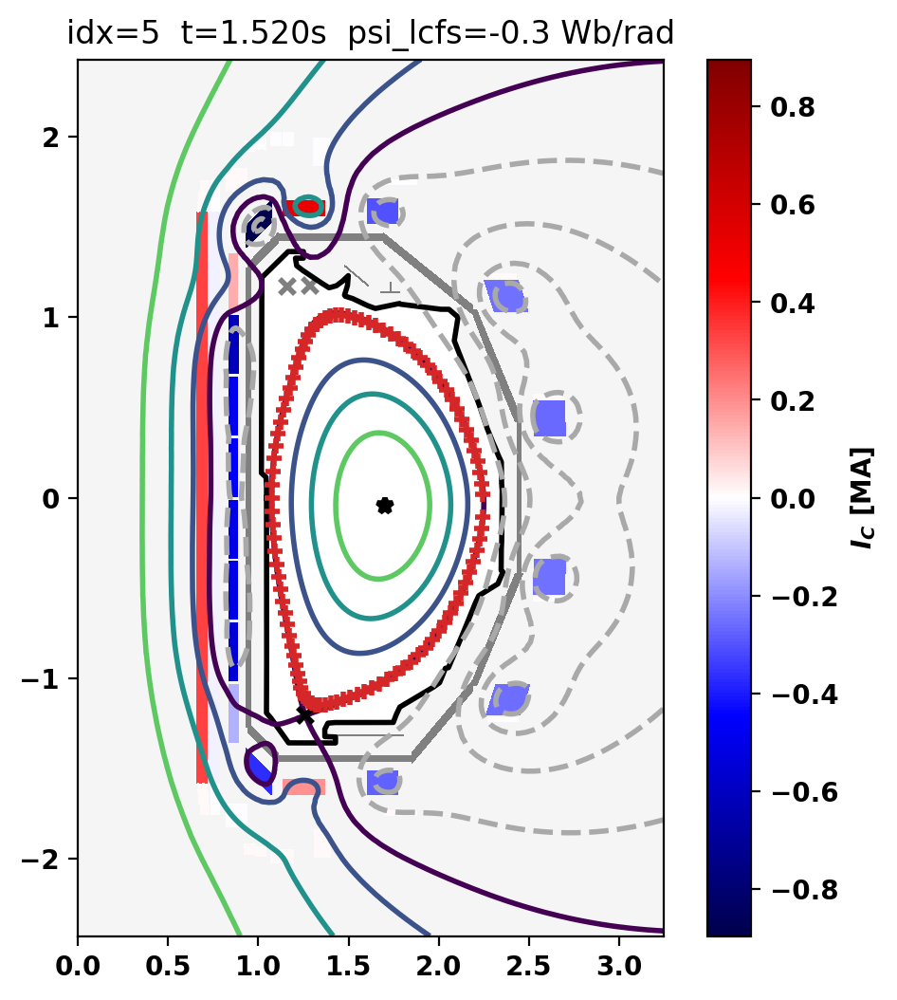

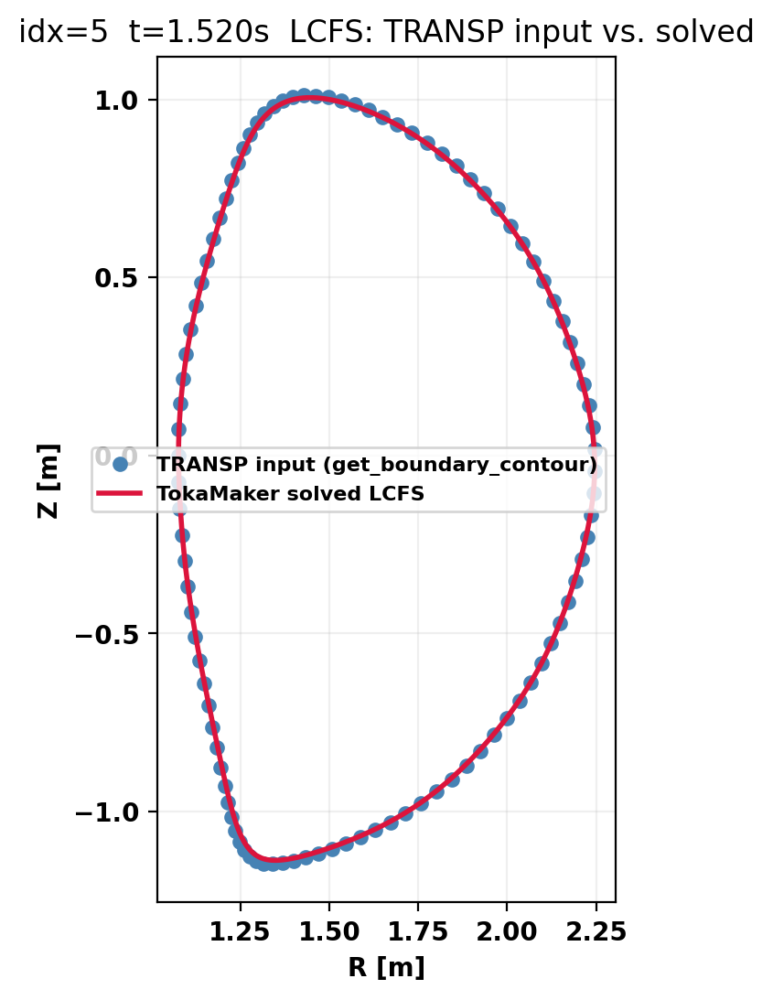

Saving gEQDSK: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/i=5.eqdsk
 Using COCOS=2...
Equilibrium Statistics:
  Topology                =   Diverted
  Toroidal Current [A]    =    1.5246E+06
  Current Centroid [m]    =    1.619 -0.050
  Magnetic Axis [m]       =    1.701 -0.044
  Elongation              =    2.023 (U:  2.073, L:  1.973)
  Triangularity           =    0.657 (U:  0.634, L:  0.680)
  Plasma Volume [m^3]     =   19.424
  q_0, q_95               =    1.161  3.997
  Plasma Pressure [Pa]    =   Axis:  3.8219E+04, Peak:  3.8219E+04
  Stored Energy [J]       =    2.3462E+05
  <Beta_pol> [%]          =   16.4151
  <Beta_tor> [%]          =    0.4394
  <Beta_n>   [%]          =    0.3640
  Diamagnetic flux [Wb]   =    4.6172E-02
  Toroidal flux [Wb]      =    4.4293E+00
  l_i                     =    0.8914


In [12]:
psi_lcfs_results = []
lcfs_solved_list = []  # TokaMaker's actual solved LCFS at each seed point, for the input-vs-output check below
# Solved scalar equilibrium parameters, for the target-vs-solved summary after the loop.
Ip_solved_list, pax_solved_list = [], []
coil_currents_list = []  # for the coil-saturation diagnostic below
kappa_solved_list, delta_solved_list = [], []
R_geo_solved_list, a_geo_solved_list = [], []
q0_solved_list, q95_solved_list, li_solved_list = [], [], []  # for the TokaMaker-vs-TRANSP scalar check below
q_profile_solved_list = []  # (psi_hat, q) full profile per seed time, for the shape-comparison cell below

mygs.settings.maxits = 100
mygs.settings.nl_tol = 1.E-3
mygs.update_settings()

# Isoflux weighted above psi - psi_lcfs_list is sign-corrected but still only a soft/best-effort
# gauge match (see markdown above), so shape should win over that less-trusted absolute value.
iso_weight = 50
psi_weight = 2
lcfs_trace_pad = 0.01  # see get_stats/trace_surf calls below for why

for idx in range(n_seed):
    isoflux_pts = isoflux_pts_list[idx]
    mygs.set_isoflux_constraints(isoflux_pts, iso_weight*np.ones(isoflux_pts.shape[0]))
    targets = np.full(isoflux_pts.shape[0], psi_lcfs_list[idx])
    weights = np.full(isoflux_pts.shape[0], psi_weight)
    mygs.set_psi_constraints(isoflux_pts, targets, weights=weights)

    build_min_norm_coil_reg(mygs)
    mygs.set_profiles(ffp_prof={'type': 'linterp', 'x': psi_sample_list[idx], 'y': ffp_prof_list[idx]},
                       pp_prof={'type': 'linterp', 'x': psi_sample_list[idx], 'y': pp_prof_list[idx]})
    mygs.set_targets(Ip=Ip_targets[idx], pax=pax_targets[idx])
    mygs.init_psi(r0_list[idx], z_list[idx], a_list[idx], kappa_list[idx], delta_list[idx])
    equil_object = mygs.solve()

    # lcfs_pad=lcfs_trace_pad: get_stats() defaults to tracing exactly at psi_norm=1.0, which is
    # numerically fragile for a limited equilibrium - same fix as lcfs_solved below.
    # li_normalization='ITER': TRANSP's LI_3 (compared below) matches this convention, not
    # get_stats()'s 'std' default - confirmed empirically at two widely separated seed times
    # (idx=0: ITER 0.548 vs TRANSP 0.523 measured, ~5% apart; idx=5: ITER 0.685 vs 0.671, ~2%
    # apart) vs. 'std' being ~30-37% too high at both. This was the dominant cause of the l_i
    # mismatch below, not a defect in the FF'/p' profiles themselves.
    stats = mygs.get_stats(lcfs_pad=lcfs_trace_pad, li_normalization='ITER')
    psi_lcfs = mygs.psi_bounds[0]
    psi_lcfs_results.append(psi_lcfs)
    Ip_solved_list.append(stats['Ip'])
    pax_solved_list.append(stats['P_ax'])
    kappa_solved_list.append(stats['kappa'])
    delta_solved_list.append(stats['delta'])
    R_geo_solved_list.append(stats['R_geo'])
    a_geo_solved_list.append(stats['a_geo'])
    q0_solved_list.append(stats['q_0'])
    q95_solved_list.append(stats['q_95'])
    # Full q(psi_hat) profile, not just the q_0/q_95 scalars above - lets the comparison
    # cell below show *where* TokaMaker and TRANSP's q profiles actually diverge (just at
    # the axis, or across a broader core region) rather than only the two endpoint values.
    q_profile_solved_list.append(mygs.get_q(npsi=200)[:2])
    li_solved_list.append(stats['l_i'])
    coil_currents, _ = mygs.get_coil_currents()
    coil_currents_list.append(coil_currents)
    print(f'idx={idx}  t={seed_times[idx]:.4f} s')
    print(f'      target psi_lcfs = {psi_lcfs_list[idx]:.2f} Wb/rad')
    print(f'      solved psi_lcfs = {psi_lcfs:.2f} Wb/rad  ({psi_lcfs*2*np.pi:.1f} Wb)')

    fig, ax = plt.subplots(1, 1)
    mygs.plot_machine(fig, ax, coil_colormap='seismic', coil_scale=1.E-6,
                      coil_clabel=r'$I_C$ [MA]', coil_symmap=True)
    mygs.plot_psi(fig, ax, plasma_nlevels=5, vacuum_nlevels=5)
    mygs.plot_constraints(fig, ax)
    ax.set_title(f'idx={idx}  t={seed_times[idx]:.3f}s  psi_lcfs={psi_lcfs:.1f} Wb/rad')
    plt.show()

    # LCFS check: input contour vs. actual solved LCFS (see markdown above). trace_surf right at
    # psi_norm=1.0 is numerically fragile, so trace a hair inside instead (same as save_eqdsk's
    # own default lcfs_pad=0.01).
    lcfs_solved = mygs.trace_surf(1.0 - lcfs_trace_pad)
    lcfs_solved_list.append(lcfs_solved)
    fig_lcfs, ax_lcfs = plt.subplots(1, 1)
    ax_lcfs.plot(isoflux_pts[:, 0], isoflux_pts[:, 1], 'o', ms=4, color='steelblue', label='TRANSP input (get_boundary_contour)')
    if lcfs_solved is not None:
        ax_lcfs.plot(lcfs_solved[:, 0], lcfs_solved[:, 1], '-', color='crimson', label='TokaMaker solved LCFS')
    else:
        print(f'      WARNING: trace_surf(1.0 - lcfs_trace_pad) failed for idx={idx} - no solved LCFS to compare')
    ax_lcfs.set_xlabel('R [m]')
    ax_lcfs.set_ylabel('Z [m]')
    ax_lcfs.set_aspect('equal')
    ax_lcfs.set_title(f'idx={idx}  t={seed_times[idx]:.3f}s  LCFS: TRANSP input vs. solved')
    ax_lcfs.legend(fontsize=8)
    ax_lcfs.grid(alpha=0.2)
    plt.show()

    eqdsk_name = os.path.join(cwd, f'i={idx}.eqdsk')
    mygs.save_eqdsk(eqdsk_name, cocos=2, nr=500, nz=500) # saving at extremely high resolution to avoid issues with contour tracing package used by TORAX, only necessary for initial eqdkss, could possibly be lowered
    mygs.print_info()

All six LCFS checks together, color-coded by time, for one at-a-glance view across the ramp instead of six separate plots.

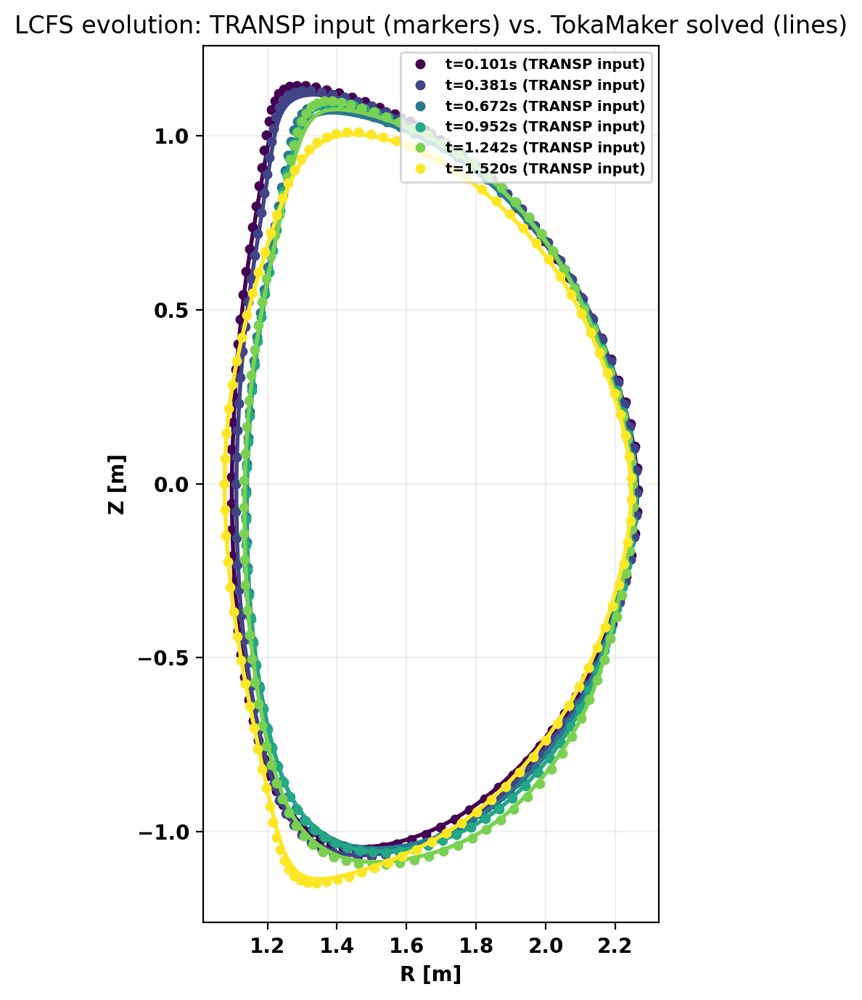

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(6, 7))
colors = plt.cm.viridis(np.linspace(0, 1, n_seed))
for idx in range(n_seed):
    ax.plot(isoflux_pts_list[idx][:, 0], isoflux_pts_list[idx][:, 1], 'o', ms=3, color=colors[idx],
            label=f't={seed_times[idx]:.3f}s (TRANSP input)')
    lcfs_solved = lcfs_solved_list[idx]
    if lcfs_solved is not None:
        ax.plot(lcfs_solved[:, 0], lcfs_solved[:, 1], '-', color=colors[idx])
ax.set_xlabel('R [m]')
ax.set_ylabel('Z [m]')
ax.set_aspect('equal')
ax.set_title('LCFS evolution: TRANSP input (markers) vs. TokaMaker solved (lines)')
ax.legend(fontsize=7, loc='upper right')
ax.grid(alpha=0.2)
plt.tight_layout()
plt.show()

Validates every TokaMaker input in one figure, replacing the earlier kappa/delta comparison (misleading - single-point `argmax`/`argmin` picks are noise-sensitive on this shape's flat top, where R can span ~7cm within 1cm of the true max Z).

- **Scalars** (`Ip`, `pax`, `R0`, `a`, `psi_lcfs`): target vs. solved scatter, on y=x if reproduced.
- **Shape** (`isoflux_pts_list`): isoflux fit residual - nearest-point distance [cm] between target and solved LCFS, shown against the smallest seed's `a` for scale.
- **Coils**: printed below - flags any coil within 50% of its (deliberately huge, &plusmn;1.5e12 A) bound; the first thing to check if the shape fit ever looks bad.

Coil saturation check (bounds are +/-1.5e12 A - deliberately huge, see that cell's markdown):
  No coil is within 50% of its (very loose) bound at any seed point - coil saturation is not the limiting factor.


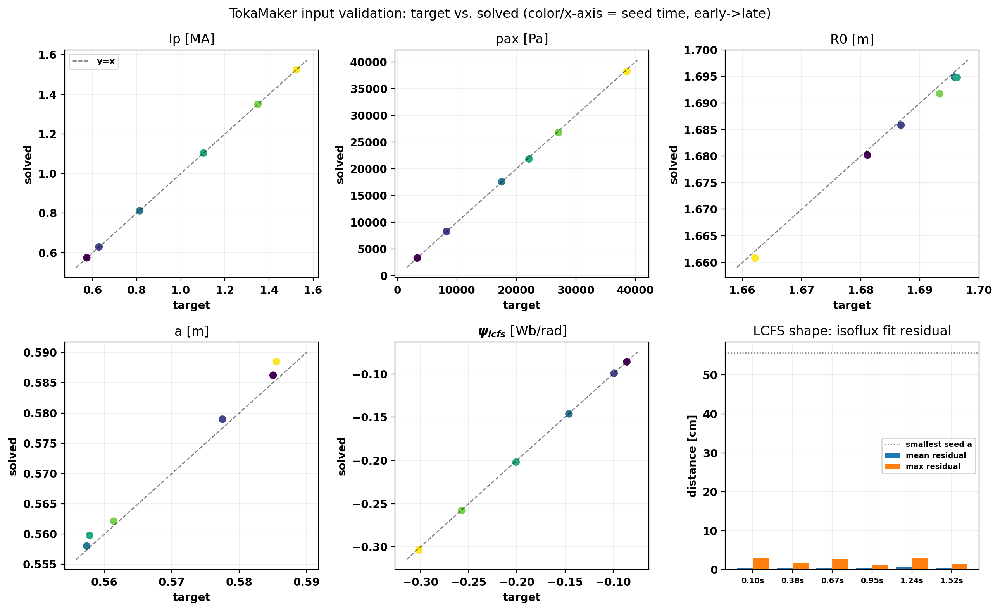

idx=0  t=0.101s  mean_residual=0.58 cm  max_residual=3.12 cm
idx=1  t=0.381s  mean_residual=0.37 cm  max_residual=1.83 cm
idx=2  t=0.672s  mean_residual=0.57 cm  max_residual=2.79 cm
idx=3  t=0.952s  mean_residual=0.31 cm  max_residual=1.19 cm
idx=4  t=1.242s  mean_residual=0.63 cm  max_residual=2.88 cm
idx=5  t=1.520s  mean_residual=0.37 cm  max_residual=1.44 cm


In [14]:
print("Coil saturation check (bounds are +/-1.5e12 A - deliberately huge, see that cell's markdown):")
any_near_bound = False
for idx, currents in enumerate(coil_currents_list):
    for name, val in currents.items():
        lo, hi = coil_bounds[name]
        bound = hi if val >= 0 else lo
        frac_of_bound = abs(val / bound) if bound != 0 else 0.0
        if frac_of_bound > 0.5:  # well below saturation, just an early warning threshold
            print(f'  idx={idx}  {name}: {val:.3e} A ({100*frac_of_bound:.1f}% of its bound)')
            any_near_bound = True
if not any_near_bound:
    print("  No coil is within 50% of its (very loose) bound at any seed point - coil saturation is not the limiting factor.")

def contour_residual(target_pts, solved_pts):
    '''Nearest-point distance [m] from each target contour point to the solved LCFS.'''
    if solved_pts is None:
        return None, None
    d = np.sqrt(((target_pts[:, None, :] - solved_pts[None, :, :])**2).sum(axis=2))
    nearest = d.min(axis=1)
    return nearest.mean(), nearest.max()

mean_resid, max_resid = [], []
for idx in range(n_seed):
    m, mx = contour_residual(isoflux_pts_list[idx], lcfs_solved_list[idx])
    mean_resid.append(m)
    max_resid.append(mx)

colors = plt.cm.viridis(np.linspace(0, 1, n_seed))
fig, axes = plt.subplots(2, 3, figsize=(13, 8))
scalar_panels = [
    ('Ip [MA]', np.array(Ip_targets) / 1e6, np.array(Ip_solved_list) / 1e6),
    ('pax [Pa]', np.array(pax_targets), np.array(pax_solved_list)),
    ('R0 [m]', np.array(r0_list), np.array(R_geo_solved_list)),
    ('a [m]', np.array(a_list), np.array(a_geo_solved_list)),
    (r'$\psi_{lcfs}$ [Wb/rad]', np.array(psi_lcfs_list), np.array(psi_lcfs_results)),
]
for ax, (label, target, solved) in zip(axes.flat, scalar_panels):
    ax.scatter(target, solved, c=colors)
    lo, hi = min(target.min(), solved.min()), max(target.max(), solved.max())
    pad = 0.05 * (hi - lo if hi > lo else abs(hi) or 1.0)
    ax.plot([lo - pad, hi + pad], [lo - pad, hi + pad], 'k--', lw=1, alpha=0.5, label='y=x')
    ax.set_xlabel('target')
    ax.set_ylabel('solved')
    ax.set_title(label)
    ax.grid(alpha=0.2)
axes.flat[0].legend(fontsize=8)

ax_resid = axes.flat[-1]
x = np.arange(n_seed)
ax_resid.bar(x - 0.2, np.array(mean_resid) * 100, width=0.4, label='mean residual')
ax_resid.bar(x + 0.2, np.array(max_resid) * 100, width=0.4, label='max residual')
ax_resid.set_xticks(x)
ax_resid.set_xticklabels([f'{t:.2f}s' for t in seed_times], fontsize=7)
ax_resid.set_ylabel('distance [cm]')
ax_resid.set_title('LCFS shape: isoflux fit residual')
ax_resid.axhline(100 * min(a_list), color='gray', ls=':', lw=1, label='smallest seed a')
ax_resid.legend(fontsize=7)
ax_resid.grid(alpha=0.2)

fig.suptitle('TokaMaker input validation: target vs. solved (color/x-axis = seed time, early->late)')
plt.tight_layout()
plt.show()

for idx in range(n_seed):
    print(f'idx={idx}  t={seed_times[idx]:.3f}s  mean_residual={mean_resid[idx]*100:.2f} cm  max_residual={max_resid[idx]*100:.2f} cm')

**TokaMaker seed equilibrium vs. TRANSP, at the very first seed point (idx=0, `t_init`)** - before TORAX (or any coupling loop) has run at all. `q_0`/`l_i` aren't part of the target-vs-solved check above (TokaMaker was never given a target for them - only `Ip`/`pax` plus the FF'/p' shape from the seed-equilibrium markdown above), so this compares them against TRANSP's own measured `q0`/`li3` directly.

**Update:** the earlier open question (Check 4's markdown, `q0`/`l_i` mismatch) only *partly* traces back to this seed equilibrium - checked across all 6 seed times, not just idx=0:

| idx | t [s] | q_0 TokaMaker | q_0 TRANSP | q_0 %diff | l_i TokaMaker (ITER) | l_i TRANSP | l_i %diff |
|---|---|---|---|---|---|---|---|
| 0 | 0.101 | 6.28 | 5.46 | +15.1% | 0.548 | 0.523 | +4.7% |
| 1 | 0.381 | 5.96 | 4.31 | +38.1% | 0.541 | 0.540 | +0.2% |
| 2 | 0.672 | 4.29 | 3.29 | +30.3% | 0.623 | 0.617 | +1.0% |
| 3 | 0.952 | 2.05 | 2.21 | -7.2% | 0.621 | 0.603 | +3.0% |
| 4 | 1.242 | 1.43 | 1.48 | -3.5% | 0.636 | 0.620 | +2.6% |
| 5 | 1.520 | 1.16 | 1.17 | -0.6% | 0.685 | 0.671 | +2.0% |

- `l_i` is **essentially fixed, everywhere** - not a seed-equilibrium quality issue at all, it was a normalization-convention mismatch in this comparison. `mygs.get_stats()`'s default `li_normalization='std'` doesn't match TRANSP's `LI_3` definition; `li_normalization='ITER'` (now used in the seed-equilibrium loop above) does, closing the gap from ~30-37% to ~0.2-4.7% at every seed time. Whether TORAX's own `l_i` (Check 4, further below) uses a matching convention to TRANSP's `LI_3` is a separate, unverified question - if that comparison still looks off after this fix, check that next rather than assuming the same root cause.
- `q_0` is **only partly fixed, and unevenly**: a uniform psi_norm output grid was under-resolving the near-axis current density (see `get_ffprime_pprime_profiles`'s "Output grid" docstring note); switching to the native, axis-dense grid (cell above) helps, but a real gap remains, worse early-to-mid ramp (idx 0-2, +15% to +38%) than late (idx 3-5, -7% to -0.6%). That early/mid window is the same one where fast-ion pressure was the largest fraction of total pressure and `get_reconstructed_Ip`'s own residual was largest (see `get_ffprime_pprime_profiles`/`get_reconstructed_Ip` docstrings) - suggestive that the near-axis p'/ff' derivation itself is least reliable there (not just a grid-sampling artifact), but this is an unconfirmed hypothesis, not a fix - worth digging into further if getting q_0 right early in the ramp matters for what this notebook is used for.

TokaMaker seed equilibrium (idx=0, t=0.1010s) vs. TRANSP (measured):
  quantity      TokaMaker       TRANSP         diff     diff %
  Ip [MA]          0.5749       0.5736       0.0014       0.2%
  pax [kPa]        3.3251       3.3536      -0.0286      -0.9%
  q_0              6.1529       5.4550       0.6979      12.8%
  q_95            11.1227      10.9461       0.1766       1.6%
  l_i              0.5477       0.5230       0.0247       4.7%


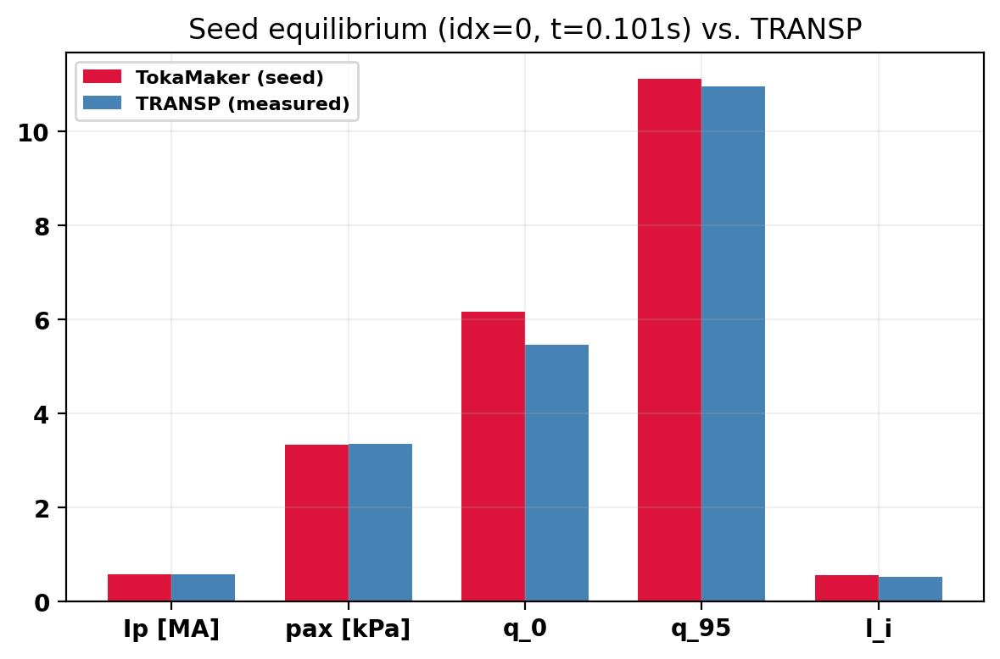

In [59]:
transp_scalars_seed = run.get_scalars()

def transp_scalar_at(key, t):
    '''Nearest-time value of a run.get_scalars() entry, or None if unavailable.'''
    d = transp_scalars_seed.get(key)
    if d is None:
        return None
    ts = np.array(sorted(d.keys()))
    return float(d[ts[np.argmin(np.abs(ts - t))]])

idx0 = 0
t0 = seed_times[idx0]
rows = [
    ('Ip [MA]', Ip_solved_list[idx0] / 1e6, transp_scalar_at('Ip', t0) / 1e6),
    ('pax [kPa]', pax_solved_list[idx0] / 1e3, transp_scalar_at('pax', t0) / 1e3),
    ('q_0', q0_solved_list[idx0], transp_scalar_at('q0', t0)),
    ('q_95', q95_solved_list[idx0], transp_scalar_at('q95', t0)),
    ('l_i', li_solved_list[idx0], transp_scalar_at('li3', t0)),
]

print(f'TokaMaker seed equilibrium (idx=0, t={t0:.4f}s) vs. TRANSP (measured):')
print(f"  {'quantity':10s} {'TokaMaker':>12s} {'TRANSP':>12s} {'diff':>12s} {'diff %':>10s}")
for name, tm_val, transp_val in rows:
    if transp_val is None:
        print(f'  {name:10s} {tm_val:12.4f} {"n/a":>12s}')
        continue
    diff = tm_val - transp_val
    pct = 100.0 * diff / transp_val if transp_val != 0 else float('nan')
    print(f'  {name:10s} {tm_val:12.4f} {transp_val:12.4f} {diff:12.4f} {pct:9.1f}%')

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
labels = [r[0] for r in rows if r[2] is not None]
tm_vals = [r[1] for r in rows if r[2] is not None]
transp_vals = [r[2] for r in rows if r[2] is not None]
x = np.arange(len(labels))
ax.bar(x - 0.18, tm_vals, width=0.36, color='crimson', label='TokaMaker (seed)')
ax.bar(x + 0.18, transp_vals, width=0.36, color='steelblue', label='TRANSP (measured)')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_title(f'Seed equilibrium (idx=0, t={t0:.3f}s) vs. TRANSP')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.show()

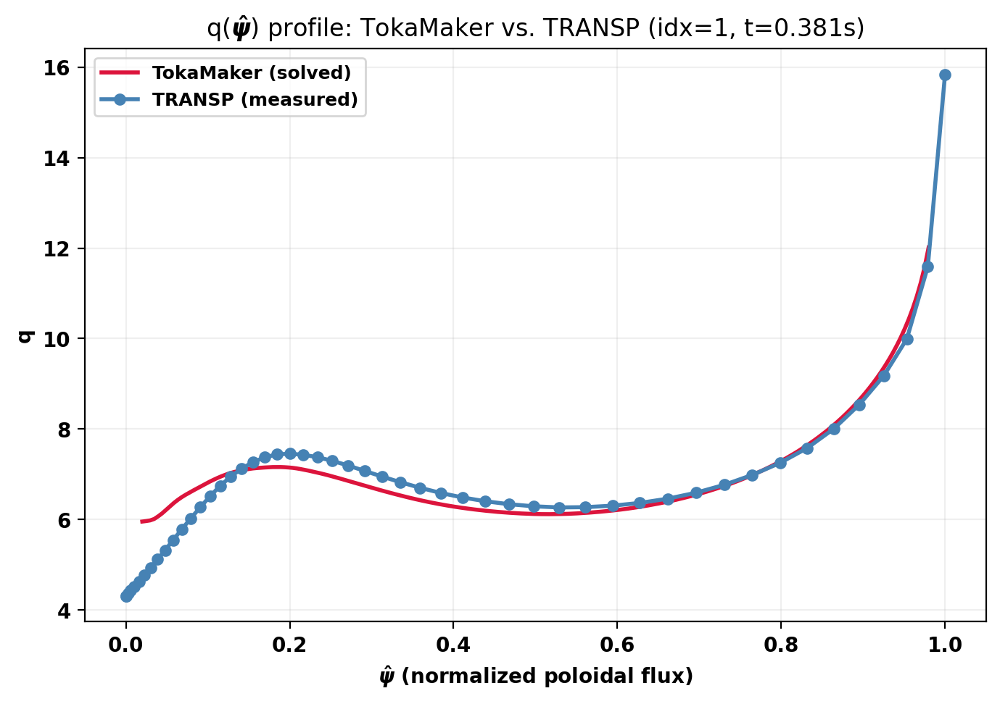

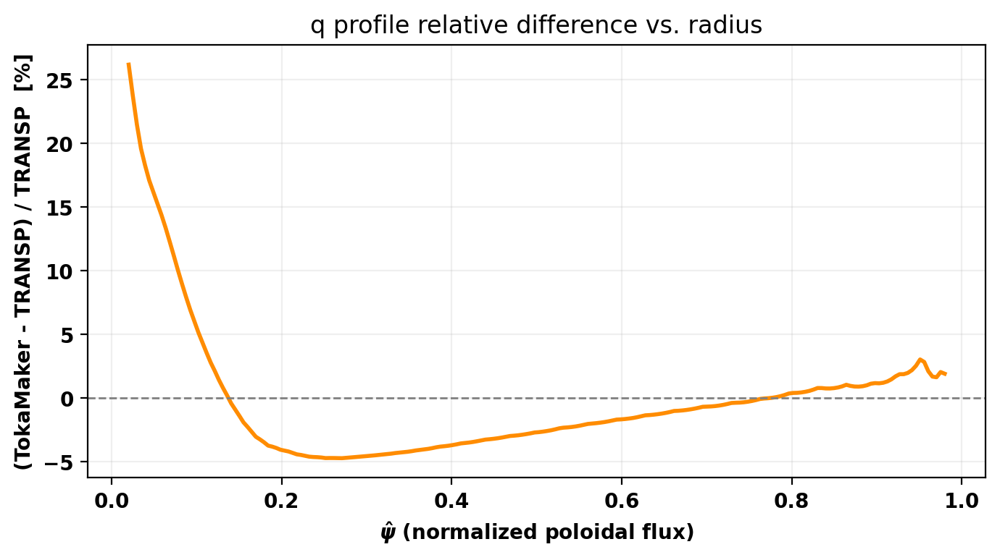

In [60]:
# Full q(psi_hat) profile comparison for idx=0 - the bar chart above only shows
# q_0/q_95 as two scalars. This shows the whole shape in between, to see whether
# the TokaMaker-vs-TRANSP gap is concentrated right at the axis (consistent with
# an axis-anchor artifact in the input FF'/p' profiles) or spread across a
# broader core region (pointing at bulk profile shape, or TokaMaker's own mesh
# resolution near the axis, instead). See transp_to_torax.py's
# get_ffprime_pprime_profiles NOISE CAVEAT / _linear_extrapolate_to_axis
# docstrings for why the axis-point-only fix there was confirmed NOT to move
# get_reconstructed_Ip's PCUR agreement - Ip is structurally almost blind to a
# single axis point, so it couldn't have told us whether q_0 was fixed either;
# this is the direct check that actually can.
idx0 = 1

psi_hat_tm, q_tm = q_profile_solved_list[idx0]

transp_profiles_idx0 = transp2imas_profiles_seed[float(seed_times[idx0])]
psi_norm_transp = transp_profiles_idx0['psi_norm']
q_transp = transp_profiles_idx0['q']

fig, ax = plt.subplots(1, 1, figsize=(7, 5))
ax.plot(psi_hat_tm, q_tm, '-', color='crimson', lw=2, label='TokaMaker (solved)')
ax.plot(psi_norm_transp, q_transp, 'o-', color='steelblue', ms=4, label='TRANSP (measured)')
ax.set_xlabel(r'$\hat{\psi}$ (normalized poloidal flux)')
ax.set_ylabel('q')
ax.set_title(f'q($\\hat{{\\psi}}$) profile: TokaMaker vs. TRANSP (idx={idx0}, t={seed_times[idx0]:.3f}s)')
ax.legend(fontsize=9)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# Relative difference vs. psi_hat, resampled onto TokaMaker's own grid - makes
# it easy to read off exactly how far into the core the mismatch extends.
q_transp_on_tm_grid = np.interp(psi_hat_tm, psi_norm_transp, q_transp)
rel_diff = 100.0 * (np.asarray(q_tm) - q_transp_on_tm_grid) / q_transp_on_tm_grid
fig2, ax2 = plt.subplots(1, 1, figsize=(7, 4))
ax2.plot(psi_hat_tm, rel_diff, '-', color='darkorange')
ax2.axhline(0, color='gray', ls='--', lw=1)
ax2.set_xlabel(r'$\hat{\psi}$ (normalized poloidal flux)')
ax2.set_ylabel('(TokaMaker - TRANSP) / TRANSP  [%]')
ax2.set_title('q profile relative difference vs. radius')
ax2.grid(alpha=0.2)
plt.tight_layout()
plt.show()

## Setup full pulse simulation

The same `run`/`geom` also supply kinetic profiles, composition, heating, fueling, and Ip via `TranspRun`'s other methods.

This file is ramp-up only - Ip is still rising at the last recorded point, no flattop/rampdown. So `t_init`/`t_final` come directly from TRANSP's time range, and `eqtimes` are each seed point's own real time.

`tmtx.load_TORAX_config` can load a full TORAX config dict for anything not covered by `tmtx.set_*`.

`t_init`/`t_final` are TRANSP's recorded range; `tx_dt` matches TORAX's timestep to TRANSP's native resolution. `tm_times` uses 15 evenly-spaced points - a chosen resolution, not data-derived.

In [17]:
# Pulse timing from TRANSP's own recorded range (see markdown above).
t_init = float(run.time[0])
t_final = float(run.time[-1])
tx_dt = float(np.mean(np.diff(run.time)))  # match TORAX's timestep to TRANSP's own native resolution

eqdsk_list = [os.path.join(cwd, f'i={idx}.eqdsk') for idx in range(n_seed)]
eqtimes = [float(t) for t in seed_times]  # each seed eqdsk's own real TRANSP time (see geometry cell above)

tmtx = TokaMaker_TORAX(
    t_init = t_init,
    t_final = t_final,
    tx_dt = tx_dt,
    eqtimes = eqtimes,
    g_eqdsk_arr = eqdsk_list,
    last_surface_factor = 0.99,
    tm_times = np.linspace(t_init, t_final, 15), # the times at which TokaMaker will solve equilibria
    tokamaker_obj = mygs, # passes existing OFT environment to TokaMaker_TORAX
)

51 evenly-spaced $\rho_{toroidal}$ points - a standard resolution, not data-derived. `rho_grid` is reused below to resample every TRANSP profile.

In [18]:
rho_grid = np.linspace(0.0, 1.0, 51)
tmtx.set_TORAX_grid(grid_type='n_rho', grid=rho_grid.size)

Heating and fueling, read directly from TRANSP.

Only NBI is present (no ECH/ICH - commented example below for shots that have them). TORAX's generic heat source is a single Gaussian in $\rho_{tor}$, so `get_nbi_heating` fits one (weighted centroid/std) to the real PBI+PBE deposition. `P_total` = PINJ (injected); real absorbed power is lower (shine-through/CX losses not represented by the Gaussian).

For fueling, SESGF (external gas puff) is negligible next to SERC_D (recycling), so SERC_D is used as `gas_puff_*`. Beam fueling (SBE) feeds `generic_particle`. No pellet source is present (commented example below).

In [19]:
nbi = run.get_nbi_heating(rho_grid)
# The moment (weighted centroid/std) fit centers away from the axis for this shot's
# deposition profile, which peaks at rho=0 and decays monotonically outward - moment
# matching on a profile that peaks at the domain boundary systematically biases the
# fitted location outward (see the debug plot below: loc~0.30, width~0.22 vs. the real
# on-axis peak). Overriding with a Gaussian centered at rho=0 and widened to match the
# real falloff fits the actual shape far better (checked: shape sum-sq error drops ~30x).
nbi_loc = 0.0
nbi_width = 0.52
tmtx.set_heating(generic_heat=nbi['P_total'],
                  generic_heat_loc=nbi_loc,
                  generic_heat_width=nbi_width,
                  nbi_current=True)

# This shot has no ECH/ICH - if a shot does, add them like so (variable names not verified
# against a real ECH/ICH shot - check run.summary() first):
# ech = run.get_ech_heating(rho_grid)
# tmtx.set_heating(..., ecrh=ech['P_total'], ecrh_loc=ech['deposition_location_avg'], ecrh_width=ech['deposition_width_avg'])
# ich = run.get_ich_heating(rho_grid)  # no set_heating slot for ICRH - use tmtx.load_TORAX_config's 'scaled_profile' source instead

fueling = run.get_fueling()
recycling = fueling['recycling_SERC_D']
beam = fueling['beam_fueling_SBE']

# gas_puff: TORAX's gas_puff source is a single exponential decaying inward from the edge
# (rho=1), not a Gaussian - recycling['width_avg'] is a Gaussian-moment fit, the wrong
# functional form entirely for this edge-peaked, monotonically-rising-to-the-boundary profile
# (see the debug plot below). get_gas_puff_decay_length fits the actual exponential model
# TORAX uses instead.
gas_puff_decay_length = fueling['recycling_SERC_D_decay_length']['decay_length_avg']

# generic_particle (SBE beam fueling): same axis-peaked-profile bias as the NBI heating fit
# above - beam['location_avg']/width_avg (loc~0.32, width~0.26) is pulled off-axis by the
# Gaussian-moment method even though the real SBE deposition peaks at rho=0 and decays
# monotonically outward. Centering at rho=0 and widening fits the real shape far better
# (checked: shape sum-sq error drops ~12x).
sbe_loc = 0.0
sbe_width = 0.475

tmtx.set_fueling(gas_puff_S_total=recycling['S_total'], gas_puff_decay_length=gas_puff_decay_length,
                  generic_particle_S_total=beam['S_total'],
                  generic_particle_location=sbe_loc,
                  generic_particle_width=sbe_width)

# This shot has no pellets - if a shot does, add via get_particle_source (variable name not
# verified - TRANSP's pellet ablation var (PLABD) looked density-like, not a rate, so check units):
# pellet = run.get_particle_source('PLABD')
# tmtx.set_fueling(..., pellet_S_total=pellet['S_total'], pellet_deposition_location=pellet['location_avg'], pellet_width=pellet['width_avg'])

Debug check for `set_heating`. Left: `P_total` (=raw PINJ, passthrough) vs. real absorbed power, for context. Right: the actual Gaussian fit (`generic_heat_loc`/`width`) vs. the real PBI+PBE deposition shape at peak power - where a hollow/multi-lobed profile would show up as a bad fit.

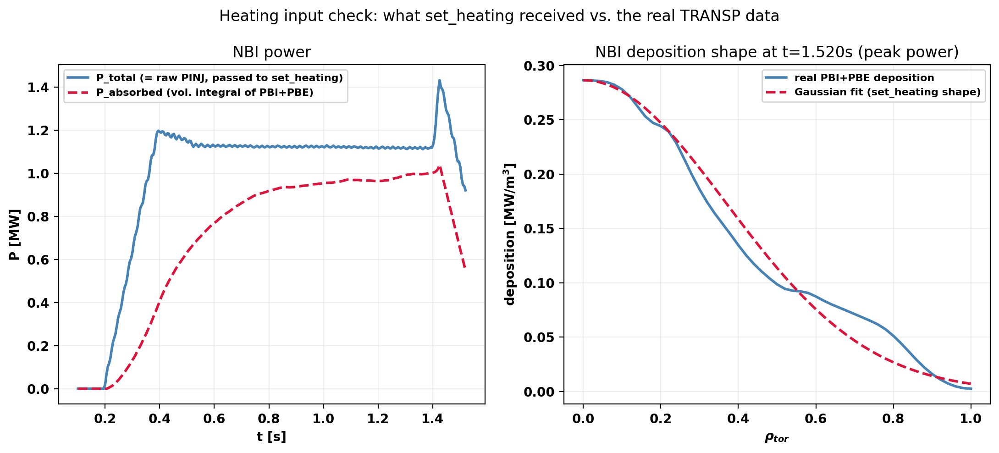

In [20]:
nbi_full = run.get_absorbed_power_profile(rho_grid)  # real ion+electron deposition shape, for comparison

fig, axes = plt.subplots(1, 2, figsize=(11, 5))

def smooth_power(t, y, window=0.2, n_grid=300):
    '''Centered moving-average smoothing for display only (e.g. NBI beam-blip
    modulation), not a physics change - resamples onto a uniform `n_grid`-point
    time grid, then box-filters with a `window`-second kernel. Robust to t being
    coarse (TRANSP's ~143-point native grid) or fine (TORAX's adaptive timestep).'''
    t = np.asarray(t, dtype=float)
    y = np.asarray(y, dtype=float)
    t_uniform = np.linspace(t.min(), t.max(), n_grid)
    y_uniform = np.interp(t_uniform, t, y)
    dt = t_uniform[1] - t_uniform[0]
    win_pts = max(1, int(round(window / dt)))
    kernel = np.ones(win_pts) / win_pts
    y_smooth = np.convolve(y_uniform, kernel, mode='same')
    return t_uniform, y_smooth

t_arr = np.array(sorted(nbi['P_total'].keys()))
p_total_arr = np.array([nbi['P_total'][t] for t in t_arr])
p_absorbed_arr = np.array([nbi['P_absorbed'][t] for t in t_arr])
# Both raw traces are beam-blip-modulated (real on/off NBI chopping) - smoothed for
# readability here; t_peak below still uses the unsmoothed p_total_arr.
t_total_s, p_total_s = smooth_power(t_arr, p_total_arr)
t_absorbed_s, p_absorbed_s = smooth_power(t_arr, p_absorbed_arr)
axes[0].plot(t_total_s, p_total_s / 1e6, '-', color='steelblue', label='P_total (= raw PINJ, passed to set_heating)')
axes[0].plot(t_absorbed_s, p_absorbed_s / 1e6, '--', color='crimson', label='P_absorbed (vol. integral of PBI+PBE)')
axes[0].set_xlabel('t [s]')
axes[0].set_ylabel('P [MW]')
axes[0].set_title('NBI power')
axes[0].legend(fontsize=8)
axes[0].grid(alpha=0.2)

t_peak = float(t_arr[np.argmax(p_total_arr)])
ion_vals = np.array(list(nbi_full['ion'][t_peak].values()))
electron_vals = np.array(list(nbi_full['electron'][t_peak].values()))
real_shape = ion_vals + electron_vals
gauss_shape = np.exp(-((rho_grid - nbi_loc) / nbi_width)**2)  # actual values passed to set_heating
gauss_shape *= real_shape.max() / gauss_shape.max()  # match peak height - shape-only comparison
axes[1].plot(rho_grid, real_shape / 1e6, '-', color='steelblue', label='real PBI+PBE deposition')
axes[1].plot(rho_grid, gauss_shape / 1e6, '--', color='crimson', label='Gaussian fit (set_heating shape)')
axes[1].set_xlabel(r'$\rho_{tor}$')
axes[1].set_ylabel('deposition [MW/m$^3$]')
axes[1].set_title(f'NBI deposition shape at t={t_peak:.3f}s (peak power)')
axes[1].legend(fontsize=8)
axes[1].grid(alpha=0.2)

fig.suptitle('Heating input check: what set_heating received vs. the real TRANSP data')
plt.tight_layout()
plt.show()

Debug check for `set_fueling`. Left: all three raw sources together (confirms SESGF's negligibility/SERC_D's dominance). Right: Gaussian fit vs. real shape for both sources actually used, each at its own peak time.

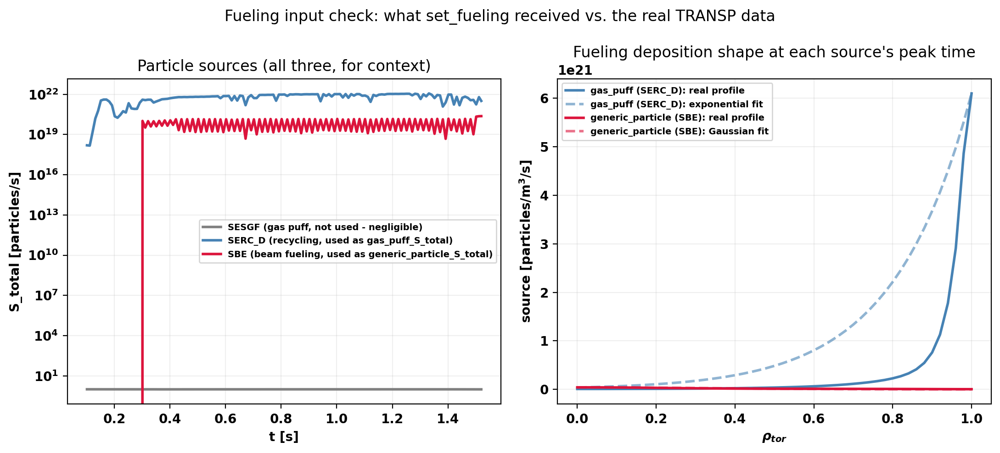

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(11, 5))

gas_puff_raw = fueling['gas_puff_SESGF']
for src, label, color in [
    (gas_puff_raw, 'SESGF (gas puff, not used - negligible)', 'gray'),
    (recycling, 'SERC_D (recycling, used as gas_puff_S_total)', 'steelblue'),
    (beam, 'SBE (beam fueling, used as generic_particle_S_total)', 'crimson'),
]:
    if src is None:
        continue
    t_arr = np.array(sorted(src['S_total'].keys()))
    s_arr = np.array([src['S_total'][t] for t in t_arr])
    axes[0].plot(t_arr, s_arr, label=label, color=color)
axes[0].set_yscale('log')
axes[0].set_xlabel('t [s]')
axes[0].set_ylabel('S_total [particles/s]')
axes[0].set_title('Particle sources (all three, for context)')
axes[0].legend(fontsize=7)
axes[0].grid(alpha=0.2)

# gas_puff (SERC_D): TORAX's real model is a single exponential decaying inward from the
# edge (rho=1), not a Gaussian - compare against that formula, using the same
# gas_puff_decay_length actually passed to set_fueling above.
prof_gp = run.get_particle_source_profile('SERC_D', rho_grid)
t_arr_gp = np.array(sorted(recycling['S_total'].keys()))
s_arr_gp = np.array([recycling['S_total'][t] for t in t_arr_gp])
t_peak_gp = float(t_arr_gp[np.argmax(s_arr_gp)])
real_gp = np.array(list(prof_gp[t_peak_gp].values()))
exp_shape = np.exp(-(1.0 - rho_grid) / gas_puff_decay_length)
exp_shape *= real_gp.max() / exp_shape.max()  # match peak height - shape-only comparison
axes[1].plot(rho_grid, real_gp, '-', color='steelblue', label='gas_puff (SERC_D): real profile')
axes[1].plot(rho_grid, exp_shape, '--', color='steelblue', alpha=0.6, label='gas_puff (SERC_D): exponential fit')

# generic_particle (SBE): genuinely Gaussian in TORAX - compare against sbe_loc/sbe_width,
# the values actually passed to set_fueling above (not the raw Gaussian-moment fit).
prof_sbe = run.get_particle_source_profile('SBE', rho_grid)
t_arr_sbe = np.array(sorted(beam['S_total'].keys()))
s_arr_sbe = np.array([beam['S_total'][t] for t in t_arr_sbe])
t_peak_sbe = float(t_arr_sbe[np.argmax(s_arr_sbe)])
real_sbe = np.array(list(prof_sbe[t_peak_sbe].values()))
gauss_shape = np.exp(-((rho_grid - sbe_loc) / sbe_width)**2)
gauss_shape *= real_sbe.max() / gauss_shape.max()
axes[1].plot(rho_grid, real_sbe, '-', color='crimson', label='generic_particle (SBE): real profile')
axes[1].plot(rho_grid, gauss_shape, '--', color='crimson', alpha=0.6, label='generic_particle (SBE): Gaussian fit')
axes[1].set_xlabel(r'$\rho_{tor}$')
axes[1].set_ylabel('source [particles/m$^3$/s]')
axes[1].set_title("Fueling deposition shape at each source's peak time")
axes[1].legend(fontsize=7)
axes[1].grid(alpha=0.2)

fig.suptitle('Fueling input check: what set_fueling received vs. the real TRANSP data')
plt.tight_layout()
plt.show()

Kinetic profiles and pedestal, from TRANSP. Full time-dependent ne/Te/Ti are passed directly (not just an initial condition). Edge (`right_bc`) values come from TRANSP's outermost surface (&rho;&asymp;0.99, not a true separatrix - TRANSP doesn't resolve the SOL).

Pedestal values are just ne/Te/Ti at &rho;=0.9 - a transport solution, not a fitted pedestal, so this may not represent a real H-mode pedestal if this phase is L-mode.

In [22]:
ne = run.get_ne(rho_grid)
Te = run.get_Te(rho_grid)
Ti = run.get_Ti(rho_grid)

tmtx.set_ne(ne, right_bc=run.get_right_bc('ne'))
tmtx.set_Te(Te, right_bc=run.get_right_bc('Te'))
tmtx.set_Ti(Ti, right_bc=run.get_right_bc('Ti'))

ped = run.get_pedestal_values(ped_top=0.9)
tmtx.set_pedestal(set_pedestal=True, ped_top=0.9,
                   n_e_ped=ped['n_e_ped'], T_e_ped=ped['T_e_ped'], T_i_ped=ped['T_i_ped'])

Fast-ion (NBI beam) pressure, from TRANSP. The `pax` scalar compared in the target-vs-solved checks above and Check 4 below is TRANSP's on-axis *total* pressure (`PMHD_IN`, incl. fast-ion/rotation), but TORAX's own `pax` (built from `pressure_thermal_total` in `_tx_update`) was thermal-only - for a shot with significant NBI this is a large, persistent gap, not a modeling-accuracy signal (TRANSP's own `PMHDF_IN`/`PMHD_IN` split showed the fast-ion share was ~33-39% on-axis mid-late in this shot).

TORAX has no NBI fast-ion physics model in this version - `numerics.enable_fast_ions`/`profile_conditions.fast_ions` only takes effect for a species some active source already declares via `zero_fast_ions()`, and currently only `ion_cyclotron_source` (ICRH) does that (this shot has no ICH, per the heating-input cells above), so a prescribed 'nbi' entry is silently dropped rather than raising an error. `run.get_fast_ion_pressure_axis()` instead reads TRANSP's own on-axis nonthermal pressure (`PMHDF_IN`) directly, and `set_fast_ion_pressure` adds it straight onto TORAX's thermal-only `pax` as a plain external correction - the same "not evolved by either code" pattern as `set_Ip`, not something either code models. Rotation pressure (`PMHDR_IN`, a few percent here) still isn't modeled by either code, so some gap to TRANSP's `pax` should remain even after this.

In [23]:
fast_ion_pressure_axis = run.get_fast_ion_pressure_axis()
tmtx.set_fast_ion_pressure(fast_ion_pressure_axis)

Debug check for `set_pedestal`: values passed vs. an independent resample at &rho;=0.9 - should overlay exactly (implementation check, not physics).

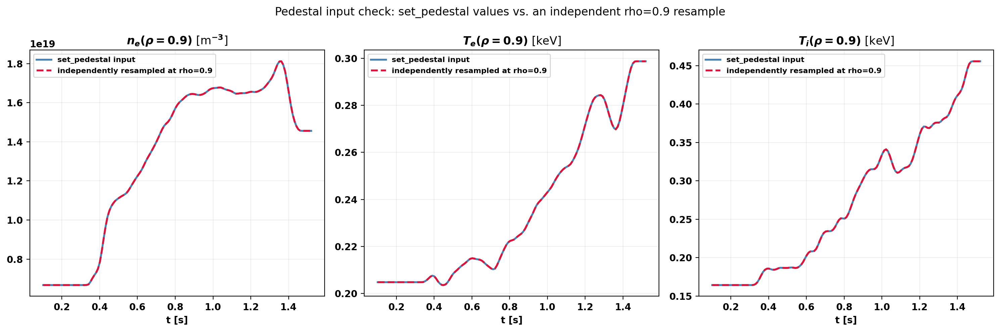

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for key, ax, label, transp_getter in [
    ('n_e_ped', axes[0], '$n_e(\\rho=0.9)$ [m$^{-3}$]', run.get_ne),
    ('T_e_ped', axes[1], '$T_e(\\rho=0.9)$ [keV]', run.get_Te),
    ('T_i_ped', axes[2], '$T_i(\\rho=0.9)$ [keV]', run.get_Ti),
]:
    t_arr = np.array(sorted(ped[key].keys()))
    ped_vals = np.array([ped[key][t] for t in t_arr])
    check_vals = np.array([transp_getter([0.9])[float(t)][0.9] for t in t_arr])
    ax.plot(t_arr, ped_vals, '-', color='steelblue', label='set_pedestal input')
    ax.plot(t_arr, check_vals, '--', color='crimson', label='independently resampled at rho=0.9')
    ax.set_xlabel('t [s]')
    ax.set_title(label)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.2)
fig.suptitle('Pedestal input check: set_pedestal values vs. an independent rho=0.9 resample')
plt.tight_layout()
plt.show()

Misc final setup: Ip and composition from TRANSP, plus evolve settings (no X-point targets - see seed-equilibria cells above).

In [25]:
# Ip: real measured PCUR trace, no hand-picked points needed.
tmtx.set_Ip(run.get_Ip())

# Composition: main-ion fractions from whichever of NH/ND/NT are present (pure D here). Zeff is
# passed as the full time trace rather than a single time-averaged scalar, so it tracks the real
# discharge. TORAX's Z_eff field is a rho+time array, so a flat {time: value} dict is ambiguous -
# TORAX's parser treats an all-float dict as a *constant-in-time radial profile* (reading our time
# keys as rho, which then fail the rho<=1 bound check). Wrapping each entry as a single-point
# profile ({time: {0.0: value}}) makes it parse as rho-uniform and time-varying instead.
# Impurity is TRANSP's avg Z/A rounded to the nearest Mavrin-supported element - a best-effort
# label, not a measurement.
comp = run.get_plasma_composition()
tmtx.set_plasma_composition(main_ion=comp['main_ion_fractions'],
                             Zeff={t: {0.0: z} for t, z in comp['Zeff_trace'].items()},
                             impurity=comp['impurity']['symbol'] if comp['impurity'] else None)

tmtx.set_evolve(density=False, Ti=False,
                 Te=False, current=True)

# No X-point/diverted modeling (get_geometry has no X-point location - see seed-eq cells above),
# so set_x_points isn't called.

tmtx.set_TokaMaker_coil_reg(coil_bounds=coil_bounds, updownsym=False)

Debug check for `set_Ip`/`set_plasma_composition`. Ip is a passthrough, shown for completeness. For composition (no natural profile plot): the real Zeff trace now passed directly to `set_plasma_composition` (previously collapsed to a single time-averaged scalar), plus the main-ion fractions/impurity species.

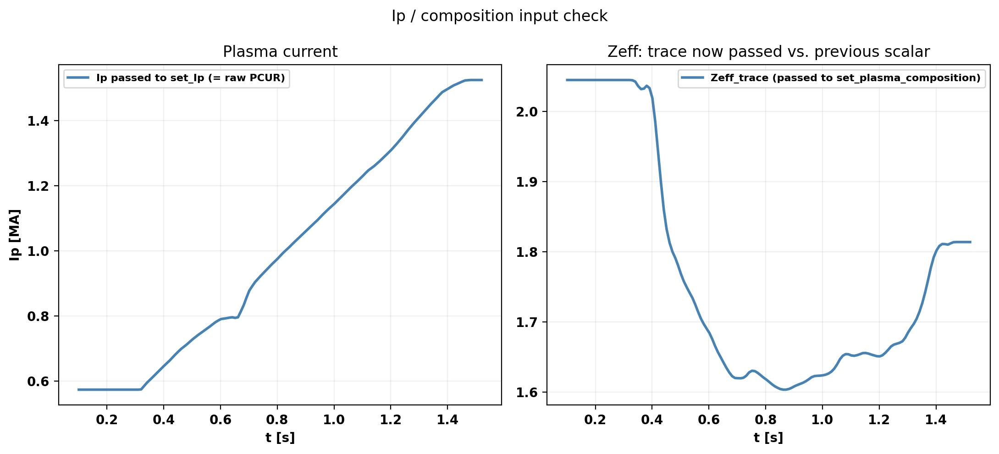

main_ion_fractions used: {'D': 1.0}
impurity used: {'symbol': 'C', 'measured_avg_Z': 6.0, 'measured_avg_A': 12.0}


In [26]:
fig, ax = plt.subplots(1, 2, figsize=(11, 5))

ip_dict = run.get_Ip()
t_arr = np.array(sorted(ip_dict.keys()))
ip_arr = np.array([ip_dict[t] for t in t_arr])
ax[0].plot(t_arr, ip_arr / 1e6, '-', color='steelblue', label='Ip passed to set_Ip (= raw PCUR)')
ax[0].set_xlabel('t [s]')
ax[0].set_ylabel('Ip [MA]')
ax[0].set_title('Plasma current')
ax[0].legend(fontsize=8)
ax[0].grid(alpha=0.2)

t_zeff = np.array(sorted(comp['Zeff_trace'].keys()))
zeff_arr = np.array([comp['Zeff_trace'][t] for t in t_zeff])
ax[1].plot(t_zeff, zeff_arr, '-', color='steelblue', label='Zeff_trace (passed to set_plasma_composition)')
ax[1].set_xlabel('t [s]')
ax[1].set_title('Zeff: trace now passed vs. previous scalar')
ax[1].legend(fontsize=8)
ax[1].grid(alpha=0.2)

fig.suptitle('Ip / composition input check')
plt.tight_layout()
plt.show()

print(f"main_ion_fractions used: {comp['main_ion_fractions']}")
print(f"impurity used: {comp['impurity']}")

## Run TokaMaker_TORAX

Runs `max_loop` coupling loops (one full TORAX simulation + `len(tm_times)` TokaMaker solves each). `fly` also accepts `output_mode` (save to `TokaMaker_TORAX_outputs`), `run_name`, and sawtooth-averaging options.

No flattop here, so `t_ave_toggle`/`t_ave_window` stay at their defaults. `relax_duration=5*tx_dt` relaxes initial profiles onto the new equilibrium each loop without eating much of this short pulse.

In [27]:
tmtx.fly(output_mode=False, max_loop=3, run_name='tmp', relax=False, initial_relax=False, relax_duration=5*tx_dt)

  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log

 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:10<00:00,  9.19it/s]


  TORAX: done (cflux=1.7448 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:21<00:00,  1.46s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.7572 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=0.7071% | cflux_TX=1.7448 Wb | cflux_TM=1.7572 Wb

  Loop 2
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:11<00:00,  8.40it/s]


  TORAX: done (cflux=1.6664 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:24<00:00,  1.66s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.6802 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=4.496% | TX-TM diff=0.8260% | cflux_TX=1.6664 Wb | cflux_TM=1.6802 Wb

  Loop 3
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:01<00:00, 57.16it/s]


  TORAX: done (cflux=1.6680 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:23<00:00,  1.54s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.6814 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.098% | TX-TM diff=0.7962% | cflux_TX=1.6680 Wb | cflux_TM=1.6814 Wb

  Max loop index (3) reached (err=0.098%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.7448           1.7572           0.7071        
  2      1.6664           1.6802           0.8260        
  3      1.6680           1.6814           0.7962        
  Total sim time: 1m 46.4s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log


## Plot results

Plots are created with built-in methods of the `TokaMaker_TORAX` object.

`plot_scalars` plots many scalar quantities over the course of the pulse. TORAX values are plotted at their full time resolution; TokaMaker outputs are plotted at the `tm_times`, i.e. the times at which TokaMaker is solved.

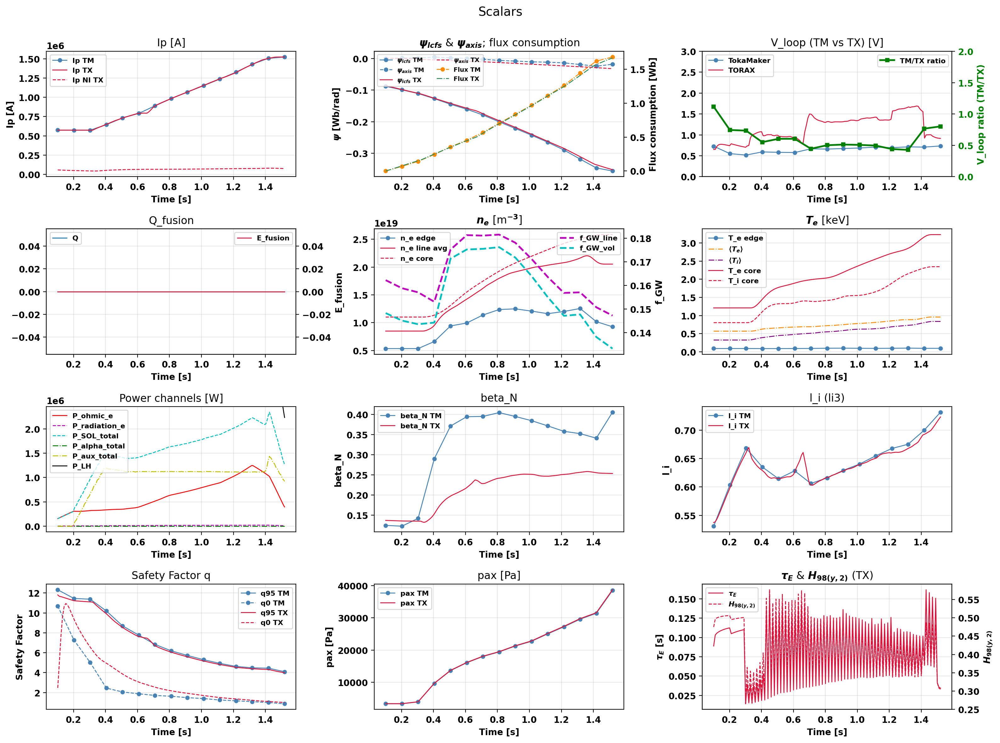

In [28]:
tmtx.plot_scalars()

The `make_movie` method produces a `.mp4` with one frame per TokaMaker solve time.

In [29]:
tmtx.make_movie(notebook_mode=True, speed_factor=0.5)
_ = tmtx.summary()


  TokaMaker_TORAX Physics Summary
  Q_max                           0
  Q_max_time                      0.101
  Q_flattop_avg                   0
  E_fusion_total_MJ               0
  beta_N_max                      0.2584
  H98_max                         0.5766
  H98_flattop_avg                 0.3949
  T_e_core_max_keV                3.231
  T_i_core_max_keV                2.346
  n_e_line_avg_max                2.204e+19
  f_GW_max                        0.1815
  q95_min                         4.091
  q0_min                          0.8696
  flux_consumed_Wb                1.681
  P_fusion_max_MW                 0
  P_ohmic_max_MW                  1.365
  l_i_flattop_avg                 0.7158
  vloop_tx_flattop_avg_V          0.9202



The evolution plots, `plot_lcfs_evolution` and `plot_profile_evolution`, show traces at different times throughout the pulse where color encodes time.

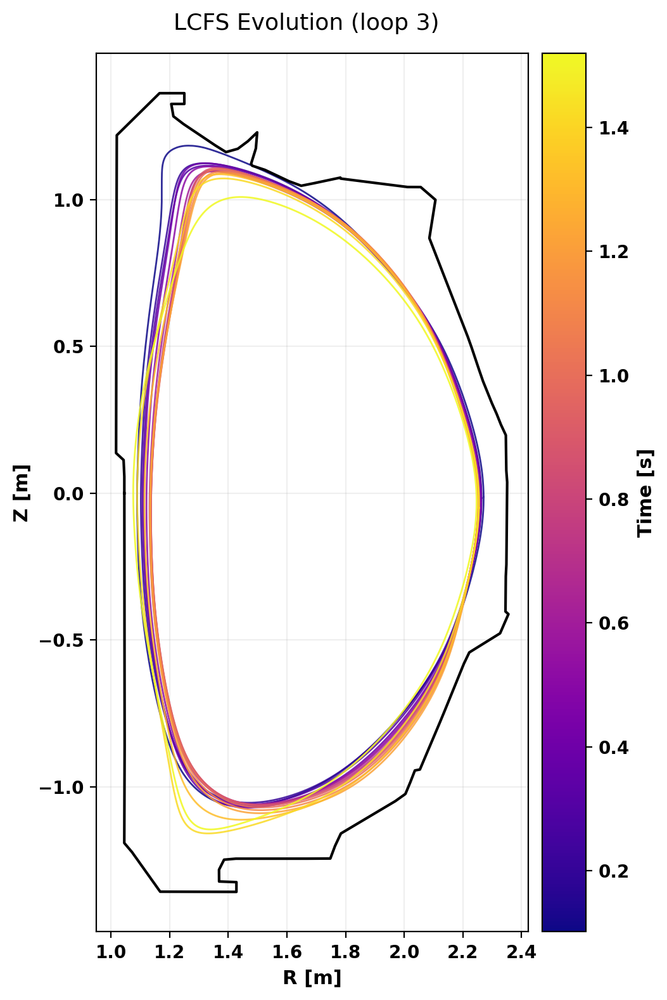

In [30]:
tmtx.plot_lcfs_evolution(one_plot=True)

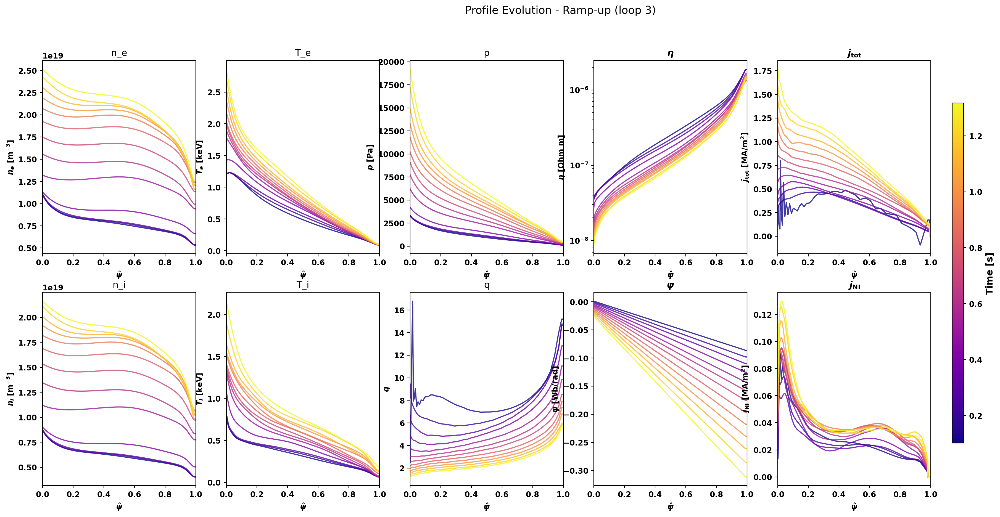

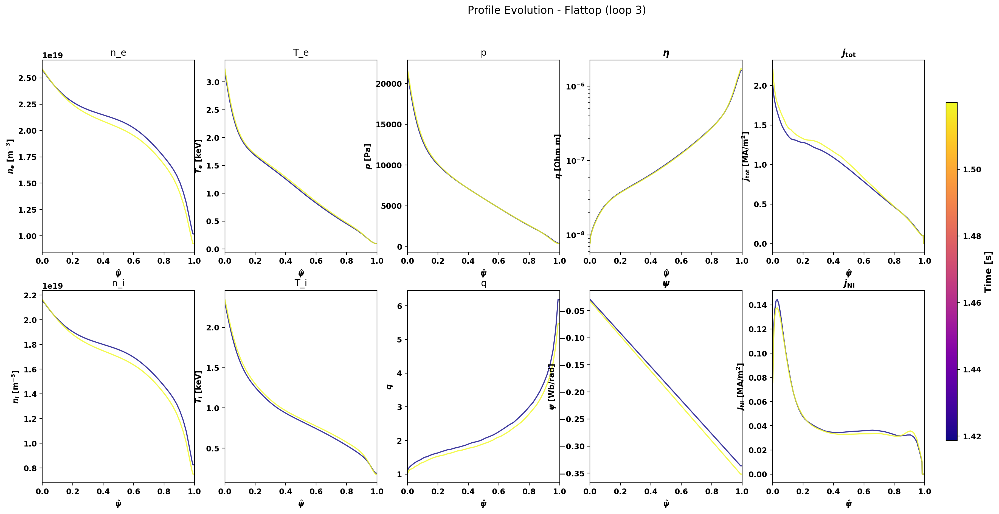

In [31]:
tmtx.plot_profile_evolution()

## Diagnostics: TRANSP vs TORAX

Three checks, cheapest/most-certain first:

1. **TRANSP source vs. resampled TORAX input** - does resampling onto `rho_grid` preserve shape/magnitude? Pure `transp_to_torax.py`, no TokaMaker_TORAX internals.
2. **TRANSP measured vs. TORAX-evolved profiles** - does TORAX's transport model evolve toward what was actually measured? A physics check, not a plumbing one.
3. **TRANSP's interpretive heat diffusivity vs. TORAX's predicted diffusivity** - `CONDE`/`CONDI` are power-balance-derived, TORAX's are first-principles predicted. Not the same kind of quantity, so don't expect an exact match - but a wildly different magnitude/shape would flag a problem.

Checks 2-3 read `tmtx._data_tree` directly for TORAX's output on its native rho grid, since the public `results`/`state` properties are remapped onto TokaMaker's `psi_norm` grid instead - a different coordinate than TRANSP's `rho_toroidal`. `_data_tree` is private/undocumented, so a future TokaMaker_TORAX version may need these two cells updated.

**Check 1**: at the six seed times, raw TRANSP profile (marker) vs. the same quantity resampled onto `rho_grid` (line) - what's actually passed to `set_ne/set_Te/set_Ti`.

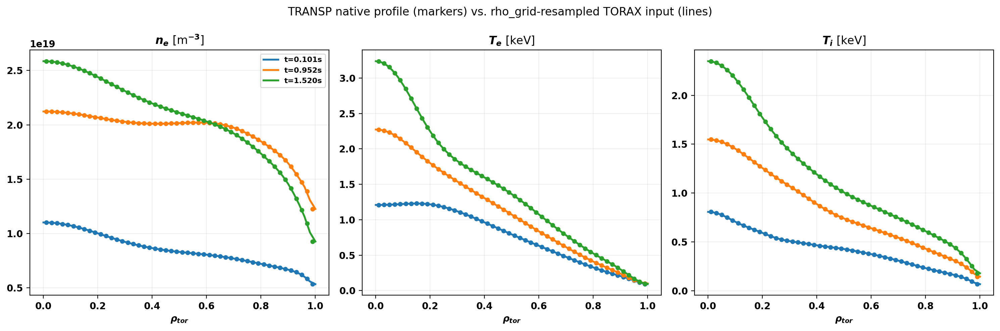

In [32]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
compare_times = [seed_times[0], seed_times[len(seed_times)//2], seed_times[-1]]
for t in compare_times:
    ne_raw = run.get_ne(run.rho)[float(t)]
    Te_raw = run.get_Te(run.rho)[float(t)]
    Ti_raw = run.get_Ti(run.rho)[float(t)]
    line, = axes[0].plot(rho_grid, list(ne[float(t)].values()), '-', label=f't={t:.3f}s')
    axes[0].plot(list(ne_raw.keys()), list(ne_raw.values()), 'o', ms=3, color=line.get_color())
    axes[1].plot(rho_grid, list(Te[float(t)].values()), '-', color=line.get_color())
    axes[1].plot(list(Te_raw.keys()), list(Te_raw.values()), 'o', ms=3, color=line.get_color())
    axes[2].plot(rho_grid, list(Ti[float(t)].values()), '-', color=line.get_color())
    axes[2].plot(list(Ti_raw.keys()), list(Ti_raw.values()), 'o', ms=3, color=line.get_color())
axes[0].set_title('$n_e$ [m$^{-3}$]')
axes[1].set_title('$T_e$ [keV]')
axes[2].set_title('$T_i$ [keV]')
for ax in axes:
    ax.set_xlabel(r'$\rho_{tor}$')
    ax.grid(alpha=0.2)
axes[0].legend(fontsize=8)
fig.suptitle('TRANSP native profile (markers) vs. rho_grid-resampled TORAX input (lines)')
plt.tight_layout()
plt.show()

**Check 1, time evolution**: same check, but as a time trace at &rho;=0.5 - should track almost exactly; a growing gap would flag a resampling problem, not a physics one.

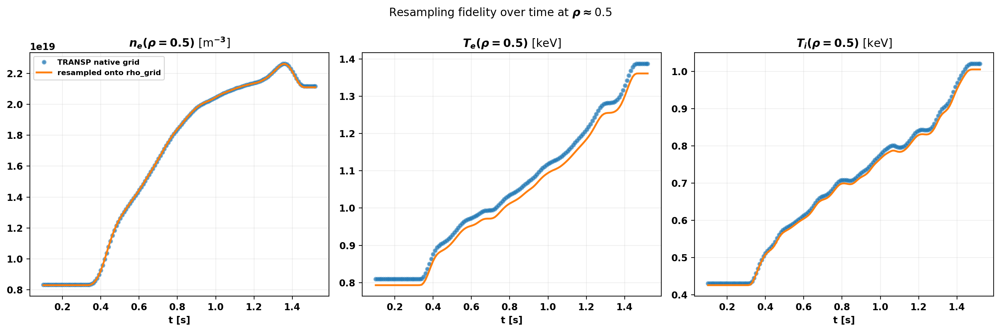

In [33]:
rho_check = 0.5

def transp_timeseries_at_rho(getter, rho_val):
    '''Time trace of a transp_to_torax get_* profile method at one rho, on whatever times it returns.'''
    prof = getter([rho_val])
    times = np.array(sorted(prof.keys()))
    values = np.array([prof[t][float(rho_val)] for t in times])
    return times, values

rho_native = run.rho[np.argmin(np.abs(run.rho - rho_check))]  # nearest native TRANSP grid point to rho_check

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for getter, ax, label in [
    (run.get_ne, axes[0], '$n_e(\\rho=0.5)$ [m$^{-3}$]'),
    (run.get_Te, axes[1], '$T_e(\\rho=0.5)$ [keV]'),
    (run.get_Ti, axes[2], '$T_i(\\rho=0.5)$ [keV]'),
]:
    t_raw, y_raw = transp_timeseries_at_rho(getter, rho_native)
    t_rs, y_rs = transp_timeseries_at_rho(getter, rho_check)
    ax.plot(t_raw, y_raw, 'o', ms=3, alpha=0.6, label='TRANSP native grid')
    ax.plot(t_rs, y_rs, '-', label='resampled onto rho_grid')
    ax.set_title(label)
    ax.set_xlabel('t [s]')
    ax.grid(alpha=0.2)
axes[0].legend(fontsize=8)
fig.suptitle(f'Resampling fidelity over time at $\\rho\\approx${rho_check}')
plt.tight_layout()
plt.show()

**Check 2**: TORAX's evolved `n_e`/`T_e`/`T_i` at `t_final` (native rho grid, from `tmtx._data_tree`) vs. TRANSP's measured profile at that same time.

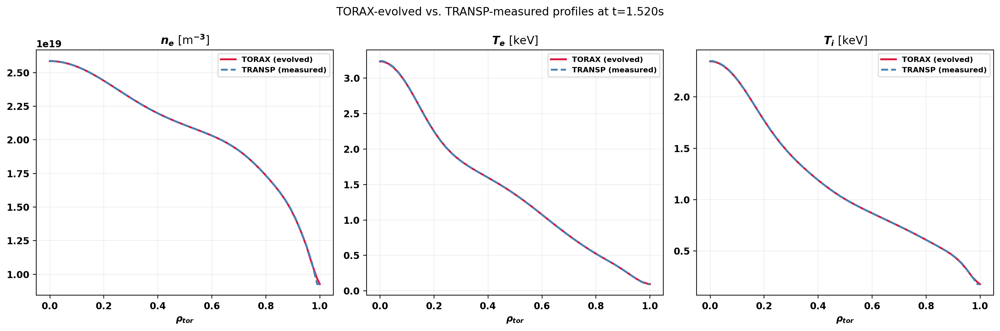

In [34]:
if not hasattr(tmtx, '_data_tree'):
    raise RuntimeError("tmtx._data_tree not found - run tmtx.fly() first.")
dt = tmtx._data_tree

def tx_profile_on_rho(var_name, time):
    '''TORAX's own <var_name> profile at the nearest available time, on its native rho grid
    (not resampled onto rho_grid, and not remapped onto TokaMaker's psi_norm grid).'''
    da = getattr(dt.profiles, var_name).sel(time=time, method='nearest')
    for rho_coord in ('rho_cell_norm', 'rho_face_norm', 'rho_norm'):
        if rho_coord in da.coords:
            return da.coords[rho_coord].values, da.values
    raise ValueError(f"{var_name!r} has no recognized rho coordinate (checked "
                      f"rho_cell_norm/rho_face_norm/rho_norm) - found: {list(da.coords)}")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for var_name, ax, transp_getter, label in [
    ('n_e', axes[0], run.get_ne, '$n_e$ [m$^{-3}$]'),
    ('T_e', axes[1], run.get_Te, '$T_e$ [keV]'),
    ('T_i', axes[2], run.get_Ti, '$T_i$ [keV]'),
]:
    rho_tx, y_tx = tx_profile_on_rho(var_name, t_final)
    ax.plot(rho_tx, y_tx, '-', color='crimson', label='TORAX (evolved)')
    y_transp = transp_getter(rho_tx)[float(t_final)]
    ax.plot(rho_tx, list(y_transp.values()), '--', color='steelblue', label='TRANSP (measured)')
    ax.set_title(label)
    ax.set_xlabel(r'$\rho_{tor}$')
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)
fig.suptitle(f'TORAX-evolved vs. TRANSP-measured profiles at t={t_final:.3f}s')
plt.tight_layout()
plt.show()

**Check 2, time evolution**: same comparison as a core (&rho;=0) time trace over the whole pulse, instead of a single snapshot at `t_final`.

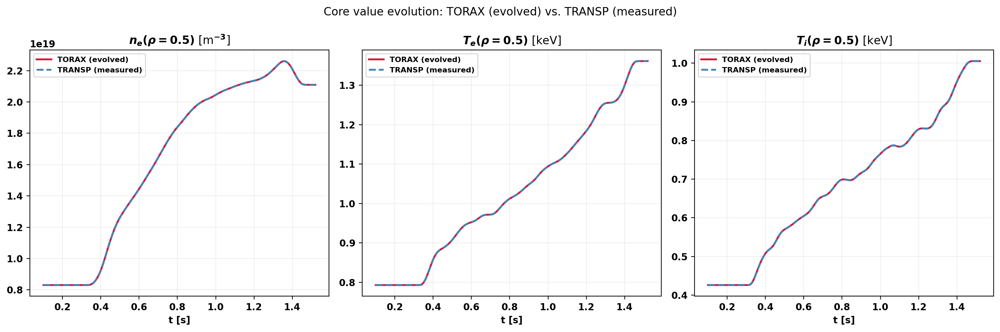

In [35]:
rho_core = 0.5

def tx_timeseries_at_rho(var_name, rho_val):
    '''TORAX's own <var_name> time trace at one rho, on its native rho grid and full TORAX time
    resolution (not just the tm_times/seed times used elsewhere in this notebook).'''
    da = getattr(dt.profiles, var_name)
    for rho_coord in ('rho_cell_norm', 'rho_face_norm', 'rho_norm'):
        if rho_coord in da.coords:
            sub = da.sel({rho_coord: rho_val}, method='nearest')
            return sub.coords['time'].values, sub.values
    raise ValueError(f"{var_name!r} has no recognized rho coordinate - found: {list(da.coords)}")

def transp_timeseries_at_rho(getter, rho_val):
    '''Time trace of a transp_to_torax get_* profile method at one rho, on whatever times it returns.'''
    prof = getter([rho_val])
    times = np.array(sorted(prof.keys()))
    values = np.array([prof[t][float(rho_val)] for t in times])
    return times, values

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for var_name, ax, transp_getter, label in [
    ('n_e', axes[0], run.get_ne, f'$n_e(\\rho={rho_core})$ [m$^{{-3}}$]'),
    ('T_e', axes[1], run.get_Te, f'$T_e(\\rho={rho_core})$ [keV]'),
    ('T_i', axes[2], run.get_Ti, f'$T_i(\\rho={rho_core})$ [keV]'),
]:
    t_tx, y_tx = tx_timeseries_at_rho(var_name, rho_core)
    ax.plot(t_tx, y_tx, '-', color='crimson', label='TORAX (evolved)')
    t_transp, y_transp = transp_timeseries_at_rho(transp_getter, rho_core)
    ax.plot(t_transp, y_transp, '--', color='steelblue', label='TRANSP (measured)')
    ax.set_title(label)
    ax.set_xlabel('t [s]')
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)
fig.suptitle('Core value evolution: TORAX (evolved) vs. TRANSP (measured)')
plt.tight_layout()
plt.show()

**Check 3**: TORAX's predicted total heat diffusivity (`chi_neo_{e,i}` + `chi_turb_{e,i}`, whichever channels are populated) vs. TRANSP's interpretive `CONDE`/`CONDI` (see markdown above for why these shouldn't match exactly).

TORAX chi_e channels found: ['chi_neo_e', 'chi_turb_e']
TORAX chi_i channels found: ['chi_neo_i', 'chi_turb_i']


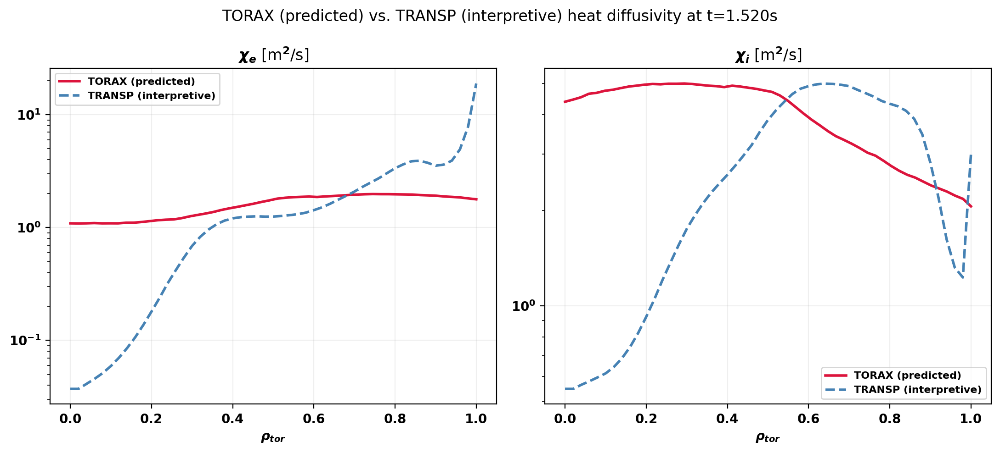

In [36]:
CHI_E_KEYS = ['chi_neo_e', 'chi_turb_e']
CHI_I_KEYS = ['chi_neo_i', 'chi_turb_i']

def total_tx_chi(keys, time):
    rho, total, found = None, None, []
    for key in keys:
        if hasattr(dt.profiles, key):
            rho, y = tx_profile_on_rho(key, time)
            total = y.copy() if total is None else total + y
            found.append(key)
    return rho, total, found

rho_chi_e, chi_e_tx, found_e = total_tx_chi(CHI_E_KEYS, t_final)
rho_chi_i, chi_i_tx, found_i = total_tx_chi(CHI_I_KEYS, t_final)
print(f'TORAX chi_e channels found: {found_e or "none - check your transport model config"}')
print(f'TORAX chi_i channels found: {found_i or "none - check your transport model config"}')

transp_chi = run.get_transport_coefficients(rho_grid)

fig, axes = plt.subplots(1, 2, figsize=(11, 5))
if chi_e_tx is not None:
    axes[0].plot(rho_chi_e, chi_e_tx, '-', color='crimson', label='TORAX (predicted)')
axes[0].plot(rho_grid, list(transp_chi['chi_e'][float(t_final)].values()), '--', color='steelblue', label='TRANSP (interpretive)')
axes[0].set_title(r'$\chi_e$ [m$^2$/s]')

if chi_i_tx is not None:
    axes[1].plot(rho_chi_i, chi_i_tx, '-', color='crimson', label='TORAX (predicted)')
axes[1].plot(rho_grid, list(transp_chi['chi_i'][float(t_final)].values()), '--', color='steelblue', label='TRANSP (interpretive)')
axes[1].set_title(r'$\chi_i$ [m$^2$/s]')

for ax in axes:
    ax.set_xlabel(r'$\rho_{tor}$')
    ax.set_yscale('log')
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)
fig.suptitle(f'TORAX (predicted) vs. TRANSP (interpretive) heat diffusivity at t={t_final:.3f}s')
plt.tight_layout()
plt.show()

**Check 3, time evolution**: same &chi; comparison at &rho;=0.5 over the whole pulse.

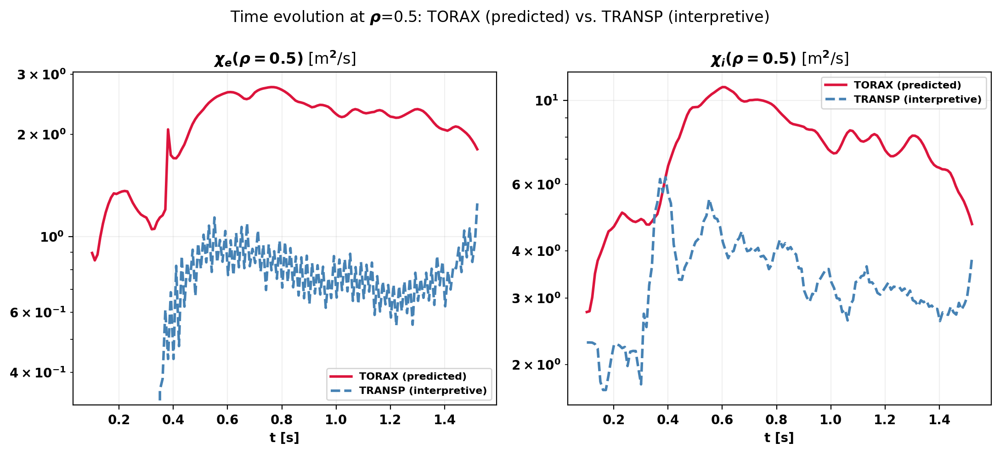

In [37]:
rho_mid = 0.5

def tx_timeseries_at_rho(var_name, rho_val):
    '''TORAX's own <var_name> time trace at one rho, on its native rho grid and full TORAX time
    resolution. Defined locally (not shared with the Check 2 time-evolution cell) so this cell
    doesn't depend on that one having been run first.'''
    da = getattr(dt.profiles, var_name)
    for rho_coord in ('rho_cell_norm', 'rho_face_norm', 'rho_norm'):
        if rho_coord in da.coords:
            sub = da.sel({rho_coord: rho_val}, method='nearest')
            return sub.coords['time'].values, sub.values
    raise ValueError(f"{var_name!r} has no recognized rho coordinate - found: {list(da.coords)}")

def transp_timeseries_at_rho(getter, rho_val):
    '''Time trace of a transp_to_torax get_* profile method at one rho, on whatever times it returns.'''
    prof = getter([rho_val])
    times = np.array(sorted(prof.keys()))
    values = np.array([prof[t][float(rho_val)] for t in times])
    return times, values

def tx_chi_timeseries(keys, rho_val):
    times, total, found = None, None, []
    for key in keys:
        if hasattr(dt.profiles, key):
            t, y = tx_timeseries_at_rho(key, rho_val)
            times = t
            total = y.copy() if total is None else total + y
            found.append(key)
    return times, total, found

t_chi_e, chi_e_tx_t, found_e_t = tx_chi_timeseries(CHI_E_KEYS, rho_mid)
t_chi_i, chi_i_tx_t, found_i_t = tx_chi_timeseries(CHI_I_KEYS, rho_mid)

transp_chi_e_t, chi_e_transp_t = transp_timeseries_at_rho(lambda g: run.get_transport_coefficients(g)['chi_e'], rho_mid)
transp_chi_i_t, chi_i_transp_t = transp_timeseries_at_rho(lambda g: run.get_transport_coefficients(g)['chi_i'], rho_mid)

fig, axes = plt.subplots(1, 2, figsize=(11, 5))
if chi_e_tx_t is not None:
    axes[0].plot(t_chi_e, chi_e_tx_t, '-', color='crimson', label='TORAX (predicted)')
axes[0].plot(transp_chi_e_t, chi_e_transp_t, '--', color='steelblue', label='TRANSP (interpretive)')
axes[0].set_title(fr'$\chi_e(\rho={rho_mid})$ [m$^2$/s]')

if chi_i_tx_t is not None:
    axes[1].plot(t_chi_i, chi_i_tx_t, '-', color='crimson', label='TORAX (predicted)')
axes[1].plot(transp_chi_i_t, chi_i_transp_t, '--', color='steelblue', label='TRANSP (interpretive)')
axes[1].set_title(fr'$\chi_i(\rho={rho_mid})$ [m$^2$/s]')

for ax in axes:
    ax.set_xlabel('t [s]')
    ax.set_yscale('log')
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)
fig.suptitle(f'Time evolution at $\\rho$={rho_mid}: TORAX (predicted) vs. TRANSP (interpretive)')
plt.tight_layout()
plt.show()

**Check 4**: TORAX's own scalar diagnostics (`dt.scalars`/`dt.profiles`, full pulse) vs. TRANSP's own
scalar diagnostics (`run.get_scalars()`) - the TORAX-vs-TRANSP analog of `tmtx.plot_scalars()`'s
TokaMaker-vs-TORAX comparison above, same panel layout. TORAX values are read at their native time
resolution (same approach as Checks 2-3); TRANSP values come from `get_scalars()` (see
`transp_to_torax.py`), read directly off the CDF's own scalar/volume-integrated diagnostics - nothing
here depends on modeling choices made upstream in this notebook.

Caveats (see `get_scalars()`'s docstring for the full list):
- `v_loop`: TRANSP's VSURC is a different specific definition (calc. avg. surface voltage) than TORAX's
  `v_loop_lcfs` (d&psi;<sub>lcfs</sub>/dt) - a sanity check, not an exact match.
- `psi_lcfs`/`psi_axis`: sign-corrected to match TORAX's/TokaMaker's COCOS convention (see below) -
  still only a sign fix, not a gauge/offset fix, so absolute values needn't match; `psi_axis` (PSI0)
  also isn't populated as a time trace in this file, so that half of the panel is TORAX-only.
- `beta_N`: this file carries no direct normalized-beta variable (only poloidal-beta channels, a
  different definition), so that panel is TORAX-only.
- `P_alpha` (and fusion power generally) is ~0 throughout - expected for a ramp-up-only, sub-flattop
  discharge.

**Sign convention fix (2026-08-19)** - `psi_lcfs`/`psi_axis` previously showed *opposite* trends
between TORAX and TRANSP (TORAX's converted psi decreasing, TRANSP's raw PLFLXA increasing), flagged
by Oak Nelson as a likely COCOS/flux-gauge mismatch rather than an Ip-sign issue (TRANSP's `PCUR` and
`BZXR`/F0 are both positive throughout, checked directly against the CDF). `transp_to_torax.py`'s
`get_geometry()`/`get_scalars()`/`get_psi_profile()` now negate TRANSP's `PLFLXA`/`PSI0`/`PLFLX` at
the source (see their "Sign convention" docstring notes) so both conventions decrease in the same
direction - this plot no longer needs its own diagnostic-only flip. **This does change the seed-
equilibrium fit**, since `psi_lcfs_list` (cells above) is built from `get_geometry()`'s `psi_lcfs` -
the fit is still soft-weighted (`psi_weight=2` vs `iso_weight=50`), so the LCFS shape shouldn't move
much, but the psi_lcfs *target* itself is now on the correct sign branch. **Re-run the seed-
equilibrium cells and `tmtx.fly(...)` after pulling this change** before trusting any Check above.

**Still open** - `q0`/`l_i`/`V_loop` mismatches are unrelated to the sign fix (they're not sign-
flipped, just different in magnitude/shape) and remain to investigate:

- **`q0`/`l_i` mismatch is largest early, and shrinks toward `t_final`** - at `t_init`, TORAX's l_i
  starts high (~0.8, a peaked current profile) and *decreases*; TRANSP's l_i starts low (~0.52) and
  *increases* - by `t_final` they're much closer (~0.7 vs ~0.67). `q95` matches well throughout (the
  two solid lines track closely), so overall Ip/geometry are consistent; it's specifically the
  *internal* current profile shape (which q0/l_i are sensitive to, and q95 mostly isn't) that starts
  off and converges. Likely explanation: every seed equilibrium is built from a generic, non-
  TRANSP-informed monotonic FF'/p' shape (see the seed-equilibrium markdown/cells above - it's only
  overwritten by TORAX's own profile after the first loop), so TORAX's current profile starts from
  that generic shape rather than anything resembling TRANSP's real one, and needs coupling-loop
  iterations to relax away the initial bias. This notebook runs `max_loop=3`; **a good diagnostic
  test is rerunning with a higher `max_loop`** (eg. 5-6) - if the early-time q0/l_i gap shrinks
  further, that confirms it's mostly an initialization/convergence artifact (an input thing,
  fixable by more loop iterations or a better-informed seed profile); if it doesn't shrink, the
  remaining gap is more likely genuine - TORAX's current diffusion + bootstrap model (Redl, the
  `pulse_design.py` default) vs. TRANSP's own interpretive bootstrap/current analysis are different
  physics models and aren't expected to agree exactly even once fully converged.
- **`V_loop`** differs by a roughly-constant vertical offset rather than an opposite trend - since
  `V_loop ≈ -dψ_lcfs/dt` is directly downstream of the current-profile/flux evolution above, this
  is plausibly the same root cause (the l_i/q0 profile-shape difference) propagating through, rather
  than an independent third issue - worth re-checking once the `max_loop` test above narrows down
  the q0/l_i question.


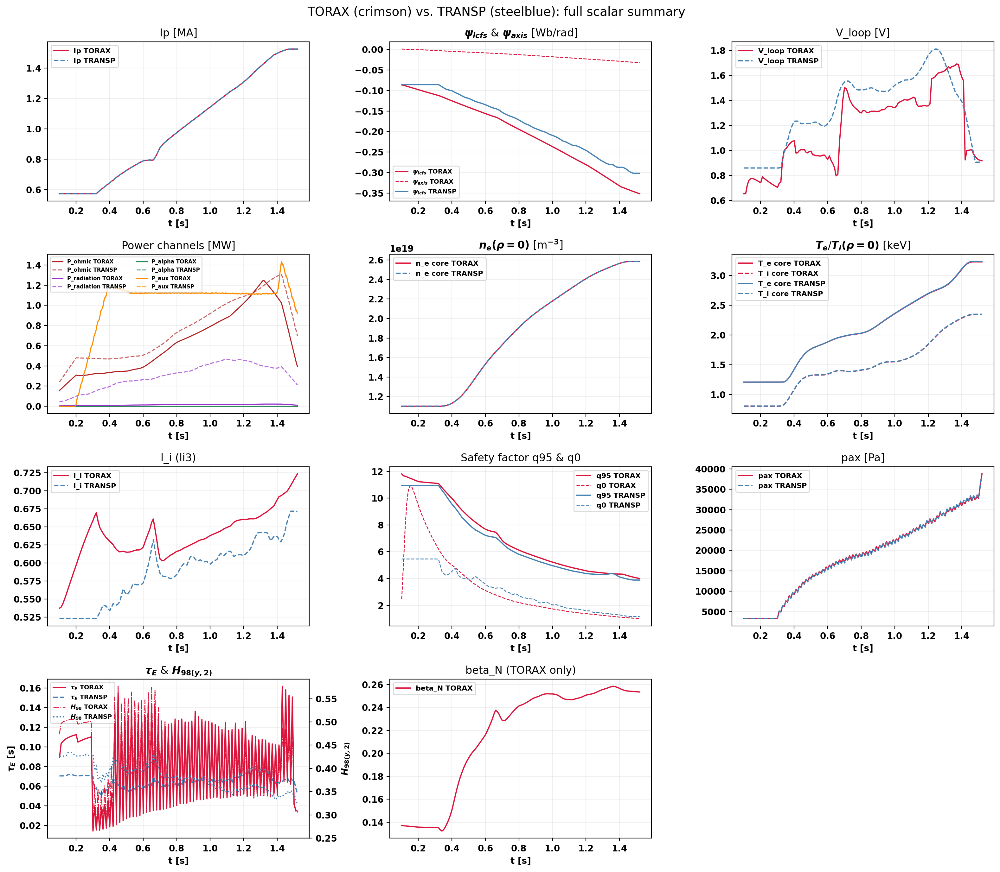

In [38]:
transp_scalars = run.get_scalars()

def tx_scalar_full(name, scale=1.0):
    '''TORAX's own <name> scalar time trace at full resolution, from dt.scalars.'''
    if not hasattr(dt.scalars, name):
        return None, None
    var = getattr(dt.scalars, name)
    return var.coords['time'].values, var.to_numpy() * scale

def tx_profile_at_rho_full(var_name, rho_val):
    '''TORAX's own <var_name> time trace at one rho, on its native rho grid (see Check 2/3 above).
    Defined locally so this cell doesn't depend on earlier ones having been run first.'''
    da = getattr(dt.profiles, var_name)
    for rho_coord in ('rho_cell_norm', 'rho_face_norm', 'rho_norm'):
        if rho_coord in da.coords:
            sub = da.sel({rho_coord: rho_val}, method='nearest')
            return sub.coords['time'].values, sub.values
    raise ValueError(f"{var_name!r} has no recognized rho coordinate - found: {list(da.coords)}")

def transp_series(key):
    '''Time trace of a run.get_scalars() entry, or (None, None) if unavailable for this file.'''
    d = transp_scalars.get(key)
    if d is None:
        return None, None
    t = np.array(sorted(d.keys()))
    y = np.array([d[tv] for tv in t])
    return t, y

def transp_at_rho0(getter):
    '''Core (rho~0) time trace of a transp_to_torax get_ne/get_Te/get_Ti-style profile getter.'''
    prof = getter([0.0])
    t = np.array(sorted(prof.keys()))
    y = np.array([prof[tv][0.0] for tv in t])
    return t, y

TX_COLOR, TRANSP_COLOR = 'crimson', 'steelblue'

fig, axes = plt.subplots(4, 3, figsize=(16, 14))

# (0,0): Ip
ax = axes[0, 0]
t_tx, y_tx = tx_scalar_full('Ip')
t_tr, y_tr = transp_series('Ip')
if t_tx is not None:
    ax.plot(t_tx, y_tx / 1e6, '-', color=TX_COLOR, lw=1.4, label='Ip TORAX')
if t_tr is not None:
    ax.plot(t_tr, y_tr / 1e6, '--', color=TRANSP_COLOR, lw=1.4, label='Ip TRANSP')
ax.set_title('Ip [MA]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

# (0,1): psi_lcfs & psi_axis
# TRANSP's psi_lcfs/psi_axis are now sign-corrected at the source (transp_to_torax.py's
# get_scalars()/get_geometry() - see their "Sign convention" docstring notes), so no extra
# flip is needed here - both curves should already trend in the same direction.
ax = axes[0, 1]
t_tx_lcfs, y_tx_lcfs = tx_profile_at_rho_full('psi', 1.0)
t_tx_axis, y_tx_axis = tx_profile_at_rho_full('psi', 0.0)
if t_tx_lcfs is not None:
    ax.plot(t_tx_lcfs, -y_tx_lcfs / (2 * np.pi), '-', color=TX_COLOR, lw=1.4, label=r'$\psi_{lcfs}$ TORAX')
if t_tx_axis is not None:
    ax.plot(t_tx_axis, -y_tx_axis / (2 * np.pi), '--', color=TX_COLOR, lw=1, label=r'$\psi_{axis}$ TORAX')
t_tr_lcfs, y_tr_lcfs = transp_series('psi_lcfs')
if t_tr_lcfs is not None:
    ax.plot(t_tr_lcfs, y_tr_lcfs, '-', color=TRANSP_COLOR, lw=1.4, label=r'$\psi_{lcfs}$ TRANSP')
t_tr_axis, y_tr_axis = transp_series('psi_axis')
if t_tr_axis is not None:
    ax.plot(t_tr_axis, y_tr_axis, '--', color=TRANSP_COLOR, lw=1, label=r'$\psi_{axis}$ TRANSP')
ax.set_title(r'$\psi_{lcfs}$ & $\psi_{axis}$ [Wb/rad]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=7)
ax.grid(alpha=0.2)

# (0,2): V_loop
ax = axes[0, 2]
t_tx, y_tx = tx_scalar_full('v_loop_lcfs')
t_tr, y_tr = transp_series('v_loop')
if t_tx is not None:
    ax.plot(t_tx, y_tx, '-', color=TX_COLOR, lw=1.4, label='V_loop TORAX')
if t_tr is not None:
    ax.plot(t_tr, y_tr, '--', color=TRANSP_COLOR, lw=1.4, label='V_loop TRANSP')
ax.set_title('V_loop [V]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

def smooth_power(t, y, window=0.2, n_grid=300):
    '''Centered moving-average smoothing for display only (e.g. NBI beam-blip
    modulation), not a physics change - resamples onto a uniform `n_grid`-point
    time grid, then box-filters with a `window`-second kernel. Robust to t being
    coarse (TRANSP's ~143-point native grid) or fine (TORAX's adaptive timestep).'''
    t = np.asarray(t, dtype=float)
    y = np.asarray(y, dtype=float)
    t_uniform = np.linspace(t.min(), t.max(), n_grid)
    y_uniform = np.interp(t_uniform, t, y)
    dt = t_uniform[1] - t_uniform[0]
    win_pts = max(1, int(round(window / dt)))
    kernel = np.ones(win_pts) / win_pts
    y_smooth = np.convolve(y_uniform, kernel, mode='same')
    return t_uniform, y_smooth

# (1,0): power channels
ax = axes[1, 0]
power_channels = [
    ('P_ohmic_e', 'P_ohmic', 'firebrick'),
    ('P_radiation_e', 'P_radiation', 'darkorchid'),
    ('P_alpha_total', 'P_alpha', 'seagreen'),
    ('P_aux_total', 'P_aux', 'darkorange'),
]
transp_power_keys = {'P_ohmic': 'P_ohmic', 'P_radiation': 'P_radiation', 'P_alpha': 'P_alpha', 'P_aux': 'P_aux'}
for tx_name, label, color in power_channels:
    scale = -1.0 if tx_name == 'P_radiation_e' else 1.0
    t_tx, y_tx = tx_scalar_full(tx_name, scale=scale)
    if t_tx is not None:
        # Smoothed for readability - P_aux in particular is beam-blip-modulated
        # (real on/off NBI chopping), not solver noise.
        t_tx_s, y_tx_s = smooth_power(t_tx, y_tx)
        ax.plot(t_tx_s, y_tx_s / 1e6, '-', color=color, lw=1.2, label=f'{label} TORAX')
    t_tr, y_tr = transp_series(transp_power_keys[label])
    if t_tr is not None:
        t_tr_s, y_tr_s = smooth_power(t_tr, y_tr)
        ax.plot(t_tr_s, y_tr_s / 1e6, '--', color=color, lw=1.2, alpha=0.7, label=f'{label} TRANSP')
ax.set_title('Power channels [MW]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=6, ncol=2)
ax.grid(alpha=0.2)

# (1,1): n_e core
ax = axes[1, 1]
t_tx, y_tx = tx_profile_at_rho_full('n_e', 0.0)
t_tr, y_tr = transp_at_rho0(run.get_ne)
if t_tx is not None:
    ax.plot(t_tx, y_tx, '-', color=TX_COLOR, lw=1.4, label='n_e core TORAX')
if t_tr is not None:
    ax.plot(t_tr, y_tr, '--', color=TRANSP_COLOR, lw=1.4, label='n_e core TRANSP')
ax.set_title(r'$n_e(\rho=0)$ [m$^{-3}$]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

# (1,2): T_e / T_i core
ax = axes[1, 2]
t_tx_te, y_tx_te = tx_profile_at_rho_full('T_e', 0.0)
t_tx_ti, y_tx_ti = tx_profile_at_rho_full('T_i', 0.0)
t_tr_te, y_tr_te = transp_at_rho0(run.get_Te)
t_tr_ti, y_tr_ti = transp_at_rho0(run.get_Ti)
if t_tx_te is not None:
    ax.plot(t_tx_te, y_tx_te, '-', color=TX_COLOR, lw=1.4, label='T_e core TORAX')
if t_tx_ti is not None:
    ax.plot(t_tx_ti, y_tx_ti, '--', color=TX_COLOR, lw=1.4, label='T_i core TORAX')
if t_tr_te is not None:
    ax.plot(t_tr_te, y_tr_te, '-', color=TRANSP_COLOR, lw=1.4, label='T_e core TRANSP')
if t_tr_ti is not None:
    ax.plot(t_tr_ti, y_tr_ti, '--', color=TRANSP_COLOR, lw=1.4, label='T_i core TRANSP')
ax.set_title(r'$T_e$/$T_i(\rho=0)$ [keV]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

# (2,0): l_i
ax = axes[2, 0]
t_tx, y_tx = tx_scalar_full('li3')
t_tr, y_tr = transp_series('li3')
if t_tx is not None:
    ax.plot(t_tx, y_tx, '-', color=TX_COLOR, lw=1.4, label='l_i TORAX')
if t_tr is not None:
    ax.plot(t_tr, y_tr, '--', color=TRANSP_COLOR, lw=1.4, label='l_i TRANSP')
ax.set_title('l_i (li3)')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

# (2,1): q95 & q0
ax = axes[2, 1]
t_tx_q95, y_tx_q95 = tx_scalar_full('q95')
t_tx_q0, y_tx_q0 = tx_profile_at_rho_full('q', 0.0)
t_tr_q95, y_tr_q95 = transp_series('q95')
t_tr_q0, y_tr_q0 = transp_series('q0')
if t_tx_q95 is not None:
    ax.plot(t_tx_q95, y_tx_q95, '-', color=TX_COLOR, lw=1.4, label='q95 TORAX')
if t_tx_q0 is not None:
    ax.plot(t_tx_q0, y_tx_q0, '--', color=TX_COLOR, lw=1, label='q0 TORAX')
if t_tr_q95 is not None:
    ax.plot(t_tr_q95, y_tr_q95, '-', color=TRANSP_COLOR, lw=1.4, label='q95 TRANSP')
if t_tr_q0 is not None:
    ax.plot(t_tr_q0, y_tr_q0, '--', color=TRANSP_COLOR, lw=1, label='q0 TRANSP')
ax.set_title('Safety factor q95 & q0')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

# (2,2): pax
ax = axes[2, 2]
t_tx, y_tx = tx_profile_at_rho_full('pressure_thermal_total', 0.0)
t_tr, y_tr = transp_series('pax')
if t_tx is not None:
    # TORAX's own pax is thermal-only - add the external fast-ion pressure correction
    # (fast_ion_pressure_axis, set via set_fast_ion_pressure - TORAX has no NBI fast-ion
    # physics model in this version, see that method's docstring) on top, at TORAX's own
    # native time resolution.
    fi_times = np.array(sorted(fast_ion_pressure_axis.keys()))
    fi_vals = np.array([fast_ion_pressure_axis[tt] for tt in fi_times])
    y_tx = y_tx + np.interp(t_tx, fi_times, fi_vals)
    ax.plot(t_tx, y_tx, '-', color=TX_COLOR, lw=1.4, label='pax TORAX')
if t_tr is not None:
    ax.plot(t_tr, y_tr, '--', color=TRANSP_COLOR, lw=1.4, label='pax TRANSP')
ax.set_title('pax [Pa]')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

# (3,0): tau_E & H98
ax = axes[3, 0]
t_tx_tau, y_tx_tau = tx_scalar_full('tau_E')
t_tr_tau, y_tr_tau = transp_series('tau_E')
if t_tx_tau is not None:
    ax.plot(t_tx_tau, y_tx_tau, '-', color=TX_COLOR, lw=1.4, label=r'$\tau_E$ TORAX')
if t_tr_tau is not None:
    ax.plot(t_tr_tau, y_tr_tau, '--', color=TRANSP_COLOR, lw=1.4, label=r'$\tau_E$ TRANSP')
ax.set_title(r'$\tau_E$ & $H_{98(y,2)}$')
ax.set_xlabel('t [s]')
ax.set_ylabel(r'$\tau_E$ [s]')
ax.grid(alpha=0.2)
ax2 = ax.twinx()
t_tx_h98, y_tx_h98 = tx_scalar_full('H98')
t_tr_h98, y_tr_h98 = transp_series('H98')
if t_tx_h98 is not None:
    ax2.plot(t_tx_h98, y_tx_h98, '-.', color=TX_COLOR, lw=1, label=r'$H_{98}$ TORAX')
if t_tr_h98 is not None:
    ax2.plot(t_tr_h98, y_tr_h98, ':', color=TRANSP_COLOR, lw=1.4, label=r'$H_{98}$ TRANSP')
ax2.set_ylabel(r'$H_{98(y,2)}$')
h1, l1 = ax.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax.legend(h1 + h2, l1 + l2, fontsize=7, loc='upper left')

# (3,1): beta_N - TORAX only, no TRANSP equivalent in this file (see markdown above)
ax = axes[3, 1]
t_tx, y_tx = tx_scalar_full('beta_N')
if t_tx is not None:
    ax.plot(t_tx, y_tx, '-', color=TX_COLOR, lw=1.4, label='beta_N TORAX')
ax.set_title('beta_N (TORAX only)')
ax.set_xlabel('t [s]')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

axes[3, 2].axis('off')

fig.suptitle('TORAX (crimson) vs. TRANSP (steelblue): full scalar summary', fontsize=14)
plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.show()


**Check 5**: all of TORAX's derived profiles that have a direct TRANSP counterpart, in one grid, at
`t_final` on TORAX's native rho grid - current density components (`j_total`/`j_ohmic`/
`j_bootstrap`/`j_non_inductive`/`j_generic_current`), the safety factor profile `q`, ion density
`n_i`, thermal pressure `pressure_thermal_total`, the poloidal flux profile `psi`, parallel
conductivity `sigma_parallel`, and the electron particle diffusivity (`D_neo_e`+`D_turb_e`). Same
rationale as Check 2 above: these are derived/model-dependent quantities (not raw measured inputs
like n_e/T_e/T_i, or TRANSP's own diffusivity check in Check 3), so this checks whether TORAX's
current diffusion, bootstrap-current, and pressure/flux evolution reproduce what TRANSP's
interpretive analysis found for this discharge, not whether an input was plumbed through correctly.

Caveats:
- `j_generic_current` (not `j_external`) is TORAX's NBI-driven-current channel here, because
  `set_heating(nbi_current=True)` above routes it through `sources.generic_current` - see
  `get_current_density()`'s docstring.
- TRANSP's `CURBS` (bootstrap) is the model this run actually summed into its total current; this
  file also carries several alternative bootstrap formulas (`CURBSSAU`, `CURBSNEO`, `CURBSWNC`, ...)
  that are close to, but not identical to, `CURBS`.
- `j_non_inductive` is compared against TRANSP's `CURXT` ("driven plasma current, smoothed"), which
  equals `CURBS + CURB` to ~1e-5 relative precision in this file - i.e. TRANSP's own
  bootstrap+beam-driven total, the same combination TORAX's non-inductive channel represents.
- This shot has no ECH/ICH (see heating-input cells above), so TORAX's `j_ecrh` isn't included here.
- `pressure_thermal_total` is compared against TRANSP's `PMHDT_IN` (the *thermal-only* component of
  the pressure fed to TRANSP's own MHD solver, identical to `PPLAS` in this file) - not the same
  variable as the `pax` scalar in the Check 4 grid above (`PMHD_IN`, on-axis *total* pressure incl.
  fast-ion/rotation); this one is the full radial profile, thermal component only, matching TORAX's
  quantity in kind as well as location.
- `psi`: TRANSP's `PLFLX`, same COCOS/sign-convention caveat as `psi_lcfs`/`psi_axis` in Check 4 and
  the seed-equilibrium cells above - compare shape/relative evolution, not absolute sign/normalization.
- `sigma_parallel`: 1/`ETA_USE`, TRANSP's "resistivity used or inferred" - the resistivity model this
  run actually used, as opposed to the several alternative Spitzer/neoclassical resistivity variables
  also in this file.
- particle diffusivity: TRANSP's `DIFFE` is a much weaker check than the Check 3 heat-diffusivity
  comparison - particle-balance-derived diffusivity is ill-conditioned wherever the interpretive
  particle flux is small (division by a near-zero flux/gradient), and this file's `DIFFE` swings both
  very large and negative at some (rho, t) points. Treat this panel as an order-of-magnitude sanity
  check at best, not a shape comparison - see `get_particle_diffusivity()`'s docstring.
- No direct TRANSP counterpart exists for `FFprime`/`pprime` (TokaMaker/TORAX-internal
  Grad-Shafranov flux-function representations) or `gm9` (a pure flux-surface geometry metric,
  already implicitly checked via the LCFS-matching seed-equilibrium cells above) - this file has no
  variables that represent those quantities, so they aren't included here.


TORAX D_e channels found: ['D_neo_e', 'D_turb_e']


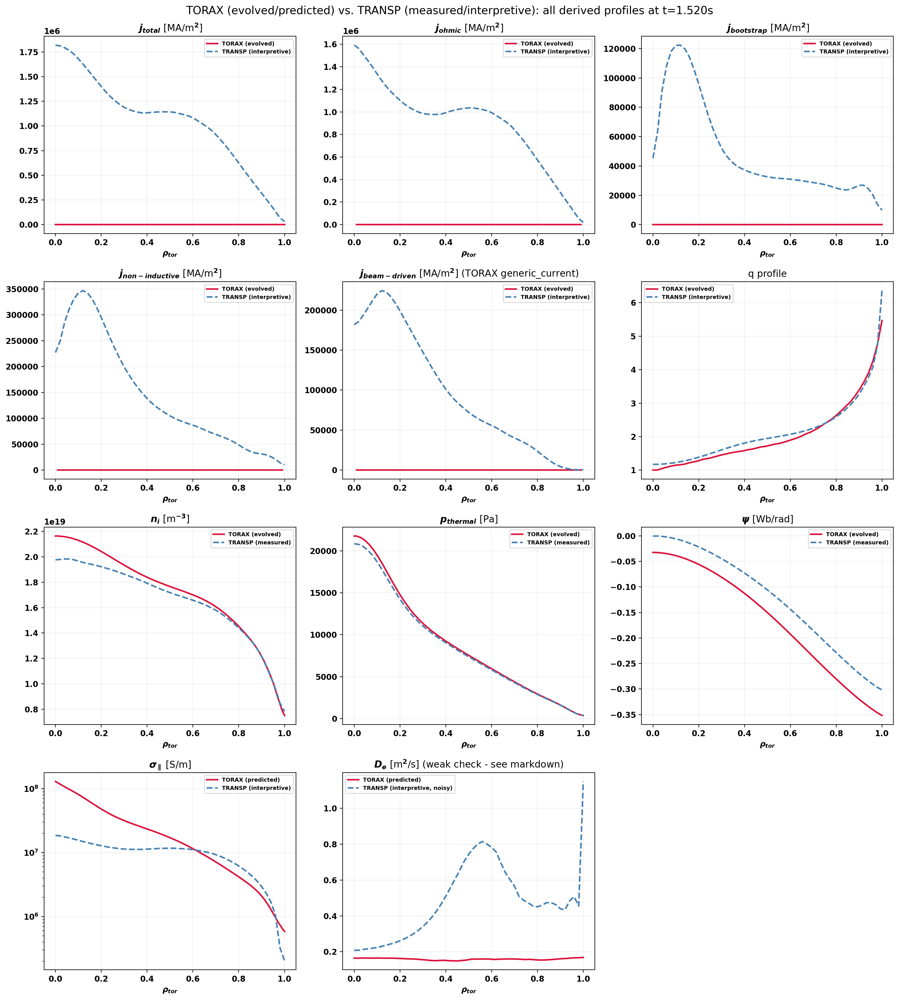

In [39]:
j_transp = run.get_current_density(rho_grid)
q_transp = run.get_q_profile(rho_grid)
n_i_transp = run.get_ion_density(rho_grid)
pressure_transp = run.get_pressure_profile(rho_grid)
psi_transp = run.get_psi_profile(rho_grid)
sigma_transp = run.get_conductivity(rho_grid)
d_e_transp = run.get_particle_diffusivity(rho_grid)

def tx_profile_on_rho_final(var_name, time):
    '''TORAX's own <var_name> profile at the nearest available time, on its native rho grid.
    Defined locally so this cell doesn't depend on earlier ones having been run first
    (same pattern as the Check 2/3 cells above).'''
    da = getattr(dt.profiles, var_name).sel(time=time, method='nearest')
    for rho_coord in ('rho_cell_norm', 'rho_face_norm', 'rho_norm'):
        if rho_coord in da.coords:
            return da.coords[rho_coord].values, da.values
    raise ValueError(f"{var_name!r} has no recognized rho coordinate - found: {list(da.coords)}")

def transp_profile_at_time(profile_dict, time):
    '''rho array + values from a {time: {rho: value}} dict at the nearest available time.'''
    if profile_dict is None:
        return None, None
    times = np.array(sorted(profile_dict.keys()))
    t_near = times[np.argmin(np.abs(times - time))]
    row = profile_dict[float(t_near)]
    rho = np.array(sorted(row.keys()))
    return rho, np.array([row[r] for r in rho])

def total_tx_d_e(time):
    '''Sum of whichever TORAX D_*_e particle-diffusivity channels are populated, on the native rho grid.'''
    rho, total, found = None, None, []
    for key in ['D_neo_e', 'D_turb_e']:
        if hasattr(dt.profiles, key):
            rho, y = tx_profile_on_rho_final(key, time)
            total = y.copy() if total is None else total + y
            found.append(key)
    return rho, total, found

def plot_profile_panel(ax, tx_name, transp_xy, title, tx_scale=1.0, tx_label='TORAX (evolved)',
                        transp_label='TRANSP (interpretive)', yscale=None):
    '''One TORAX-vs-TRANSP profile panel at t_final.'''
    rho_tx, y_tx = tx_profile_on_rho_final(tx_name, t_final)
    ax.plot(rho_tx, y_tx * tx_scale, '-', color='crimson', label=tx_label)
    rho_tr, y_tr = transp_xy
    if rho_tr is not None:
        ax.plot(rho_tr, y_tr, '--', color='steelblue', label=transp_label)
    ax.set_title(title)
    ax.set_xlabel(r'$\rho_{tor}$')
    if yscale is not None:
        ax.set_yscale(yscale)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=7)

fig, axes = plt.subplots(4, 3, figsize=(16, 18))

plot_profile_panel(axes[0, 0], 'j_total', transp_profile_at_time(j_transp['total'], t_final),
                    r'$j_{total}$ [MA/m$^2$]', tx_scale=1e-6)
plot_profile_panel(axes[0, 1], 'j_ohmic', transp_profile_at_time(j_transp['ohmic'], t_final),
                    r'$j_{ohmic}$ [MA/m$^2$]', tx_scale=1e-6)
plot_profile_panel(axes[0, 2], 'j_bootstrap', transp_profile_at_time(j_transp['bootstrap'], t_final),
                    r'$j_{bootstrap}$ [MA/m$^2$]', tx_scale=1e-6)

plot_profile_panel(axes[1, 0], 'j_non_inductive', transp_profile_at_time(j_transp['non_inductive'], t_final),
                    r'$j_{non-inductive}$ [MA/m$^2$]', tx_scale=1e-6)
plot_profile_panel(axes[1, 1], 'j_generic_current', transp_profile_at_time(j_transp['beam_driven'], t_final),
                    r'$j_{beam-driven}$ [MA/m$^2$] (TORAX generic_current)', tx_scale=1e-6)
plot_profile_panel(axes[1, 2], 'q', transp_profile_at_time(q_transp, t_final), 'q profile')

plot_profile_panel(axes[2, 0], 'n_i', transp_profile_at_time(n_i_transp, t_final),
                    r'$n_i$ [m$^{-3}$]', tx_label='TORAX (evolved)', transp_label='TRANSP (measured)')
plot_profile_panel(axes[2, 1], 'pressure_thermal_total', transp_profile_at_time(pressure_transp, t_final),
                    r'$p_{thermal}$ [Pa]', tx_label='TORAX (evolved)', transp_label='TRANSP (measured)')

ax = axes[2, 2]
rho_tx, y_tx = tx_profile_on_rho_final('psi', t_final)
ax.plot(rho_tx, -y_tx / (2 * np.pi), '-', color='crimson', label='TORAX (evolved)')
rho_tr, y_tr = transp_profile_at_time(psi_transp, t_final)
if rho_tr is not None:
    ax.plot(rho_tr, y_tr, '--', color='steelblue', label='TRANSP (measured)')
ax.set_title(r'$\psi$ [Wb/rad]')
ax.set_xlabel(r'$\rho_{tor}$')
ax.grid(alpha=0.2)
ax.legend(fontsize=7)

plot_profile_panel(axes[3, 0], 'sigma_parallel', transp_profile_at_time(sigma_transp, t_final),
                    r'$\sigma_{\parallel}$ [S/m]', tx_label='TORAX (predicted)', yscale='log')

ax = axes[3, 1]
rho_tx, y_tx, found = total_tx_d_e(t_final)
print(f'TORAX D_e channels found: {found or "none - check your transport model config"}')
if y_tx is not None:
    ax.plot(rho_tx, y_tx, '-', color='crimson', label='TORAX (predicted)')
rho_tr, y_tr = transp_profile_at_time(d_e_transp, t_final)
if rho_tr is not None:
    ax.plot(rho_tr, y_tr, '--', color='steelblue', label='TRANSP (interpretive, noisy)')
ax.set_title(r'$D_e$ [m$^2$/s] (weak check - see markdown)')
ax.set_xlabel(r'$\rho_{tor}$')
ax.grid(alpha=0.2)
ax.legend(fontsize=7)

axes[3, 2].axis('off')

fig.suptitle(f'TORAX (evolved/predicted) vs. TRANSP (measured/interpretive): all derived profiles at t={t_final:.3f}s', fontsize=14)
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()


## Gas puff scan: evolved TORAX density vs. gas puff amount

Reruns the coupled TokaMaker+TORAX loop once per gas-puff scale factor, scaling the measured
`gas_puff_S_total` trace (`recycling['S_total']` from the heating/fueling cells above) by each
value in `GAS_PUFF_SCALES` while holding everything else (NBI heating/current, beam fueling, Ip,
composition, pedestal, seed equilibria) fixed at this notebook's baseline setup. For each scale, it
records TORAX's evolved line-averaged density (`n_e_line_avg`) over the full pulse plus its
core (&rho;=0) density at `t_final`, then plots both against the gas puff amount.

**Cost/risk - read before running:**
- Each scale factor reruns the full `tmtx.fly(...)` coupled loop from scratch - the same call that
  took non-trivial time once already above. `len(GAS_PUFF_SCALES)` scale factors means that many
  full reruns; keep the list short (5 points by default) unless you're prepared to wait.
- Repeated **in-process** `fly()` calls carry a known JAX/XLA risk - `fly()`'s own source disables
  JAX's persistent compilation cache specifically because repeated calls were causing semaphore
  leaks. For a handful of points this cell's in-process loop is usually fine, but if it degrades or
  crashes partway through, restart the kernel and either resume from a shorter `GAS_PUFF_SCALES`
  list or switch to an out-of-process-per-point pattern (see the `generic_particle_scan`/`ip_scan`/
  `pedestal_scan` worker-script scans in the sibling `KF_tokamaker/kf_pulse_ex` project for a
  subprocess-per-scan-point template - each point there runs as its own `scan_worker.py` process).
- **A scan point can fail to converge** (eg. TORAX raising `SimError.LOW_TEMPERATURE_COLLAPSE`) -
  this shot's baseline run itself hit this reproducibly at `t_init`, where `PINJ=0` (no NBI yet)
  and `Ip`/`T_e` are both low: with `relax_kinetics=False` (the `fly()` default), the initial
  relax never evolves T_e/T_i, so the coupled loop's first real evaluation of TORAX's predictive
  transport model (QLKNN by default) is thrown straight at this cold, low-current start - a regime
  that's plausibly outside QLKNN's well-validated envelope. `fly()` is called below with
  `relax_kinetics=True` so the initial relax pre-evolves n_e/T_e/T_i under the real model for a
  short window first, as a gentler on-ramp - if a scan point still collapses, that's a genuine
  physics/numerics result for that gas puff level, not necessarily a bug, so each scan point below
  is wrapped in its own try/except regardless: a failure is logged and skipped rather than aborting
  the whole scan, and the failed scale is called out on the final plot instead of silently missing.
- After this cell runs, `tmtx`'s internal state (and `dt = tmtx._data_tree` used by the Checks
  above) is restored to the baseline (measured) gas puff amount - see the restore step at the end of
  the cell, which itself is also wrapped in try/except so a failure there doesn't get silently missed.
- This shot has no flattop (ramp-up only), so "evolved density" here means the value at `t_final`,
  not a mid-flattop average.


  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log

 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:12<00:00,  7.90it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:22<00:00,  4.36it/s]


  TORAX: done (cflux=1.5749 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:22<00:00,  1.50s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.5945 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=1.2298% | cflux_TX=1.5749 Wb | cflux_TM=1.5945 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 233.46it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:25<00:00,  3.96it/s]


  TORAX: done (cflux=1.4882 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:22<00:00,  1.49s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.5097 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=5.505% | TX-TM diff=1.4236% | cflux_TX=1.4882 Wb | cflux_TM=1.5097 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 250.05it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:10<00:00,  9.50it/s]


  TORAX: done (cflux=1.4743 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:22<00:00,  1.52s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.4977 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.932% | TX-TM diff=1.5622% | cflux_TX=1.4743 Wb | cflux_TM=1.4977 Wb

  Max loop index (3) reached (err=0.932%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.5749           1.5945           1.2298        
  2      1.4882           1.5097           1.4236        
  3      1.4743           1.4977           1.5622        
  Total sim time: 2m 31.2s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log
scale=0.00  peak gas_puff S_total=0.000e+00 particles/s  -> n_e_line_avg(t_final)=2.079e+19 m^-3, n_e_core(t_final)=2.641e+19 m^-3
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log



 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 271.04it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:07<00:00, 12.66it/s]


  TORAX: done (cflux=1.6110 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:23<00:00,  1.56s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.6299 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=1.1623% | cflux_TX=1.6110 Wb | cflux_TM=1.6299 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 292.87it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:06<00:00, 14.32it/s]


  TORAX: done (cflux=1.5175 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:22<00:00,  1.53s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.5406 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=5.801% | TX-TM diff=1.4982% | cflux_TX=1.5175 Wb | cflux_TM=1.5406 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 307.09it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:06<00:00, 14.18it/s]


  TORAX: done (cflux=1.5048 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:23<00:00,  1.54s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.5284 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.839% | TX-TM diff=1.5462% | cflux_TX=1.5048 Wb | cflux_TM=1.5284 Wb

  Max loop index (3) reached (err=0.839%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.6110           1.6299           1.1623        
  2      1.5175           1.5406           1.4982        
  3      1.5048           1.5284           1.5462        
  Total sim time: 1m 38.3s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log
scale=0.20  peak gas_puff S_total=2.297e+21 particles/s  -> n_e_line_avg(t_final)=2.185e+19 m^-3, n_e_core(t_final)=2.858e+19 m^-3
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log



 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 310.47it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:08<00:00, 11.37it/s]


  TORAX: done (cflux=1.6674 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:23<00:00,  1.54s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.6868 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=1.1480% | cflux_TX=1.6674 Wb | cflux_TM=1.6868 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 235.38it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:09<00:00, 10.31it/s]


  TORAX: done (cflux=1.5711 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:26<00:00,  1.79s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.5944 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=5.777% | TX-TM diff=1.4646% | cflux_TX=1.5711 Wb | cflux_TM=1.5944 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 351.65it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:06<00:00, 16.42it/s]


  TORAX: done (cflux=1.5574 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:23<00:00,  1.54s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.5813 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.869% | TX-TM diff=1.5133% | cflux_TX=1.5574 Wb | cflux_TM=1.5813 Wb

  Max loop index (3) reached (err=0.869%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.6674           1.6868           1.1480        
  2      1.5711           1.5944           1.4646        
  3      1.5574           1.5813           1.5133        
  Total sim time: 1m 44.7s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log
scale=0.50  peak gas_puff S_total=5.743e+21 particles/s  -> n_e_line_avg(t_final)=2.290e+19 m^-3, n_e_core(t_final)=3.092e+19 m^-3
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log



 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 344.00it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:08<00:00, 12.27it/s]


  TORAX: done (cflux=1.7495 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:23<00:00,  1.54s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.7680 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=1.0447% | cflux_TX=1.7495 Wb | cflux_TM=1.7680 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 357.24it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:06<00:00, 15.69it/s]


  TORAX: done (cflux=1.6447 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:22<00:00,  1.51s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.6686 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=5.994% | TX-TM diff=1.4325% | cflux_TX=1.6447 Wb | cflux_TM=1.6686 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 338.47it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:08<00:00, 12.01it/s]


  TORAX: done (cflux=1.6308 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:23<00:00,  1.53s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.6547 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.846% | TX-TM diff=1.4450% | cflux_TX=1.6308 Wb | cflux_TM=1.6547 Wb

  Max loop index (3) reached (err=0.846%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.7495           1.7680           1.0447        
  2      1.6447           1.6686           1.4325        
  3      1.6308           1.6547           1.4450        
  Total sim time: 1m 37.8s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log
scale=1.00  peak gas_puff S_total=1.149e+22 particles/s  -> n_e_line_avg(t_final)=2.454e+19 m^-3, n_e_core(t_final)=3.470e+19 m^-3
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log



 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 325.65it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:09<00:00, 10.46it/s]


  TORAX: done (cflux=1.8297 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:24<00:00,  1.63s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.8485 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=1.0205% | cflux_TX=1.8297 Wb | cflux_TM=1.8485 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 235.47it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:11<00:00,  8.95it/s]


  TORAX: done (cflux=1.7198 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:30<00:00,  2.01s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.7439 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=6.004% | TX-TM diff=1.3806% | cflux_TX=1.7198 Wb | cflux_TM=1.7439 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 200.84it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:11<00:00,  8.82it/s]


  TORAX: done (cflux=1.7041 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:26<00:00,  1.79s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.7283 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.914% | TX-TM diff=1.3984% | cflux_TX=1.7041 Wb | cflux_TM=1.7283 Wb

  Max loop index (3) reached (err=0.914%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.8297           1.8485           1.0205        
  2      1.7198           1.7439           1.3806        
  3      1.7041           1.7283           1.3984        
  Total sim time: 2m 1.1s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log
scale=1.50  peak gas_puff S_total=1.723e+22 particles/s  -> n_e_line_avg(t_final)=2.590e+19 m^-3, n_e_core(t_final)=3.790e+19 m^-3
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log



 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 265.24it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:12<00:00,  7.90it/s]


  TORAX: done (cflux=1.9105 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:25<00:00,  1.71s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.9294 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=0.9822% | cflux_TX=1.9105 Wb | cflux_TM=1.9294 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 174.15it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:07<00:00, 12.46it/s]


  TORAX: done (cflux=1.7938 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:22<00:00,  1.49s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.8185 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=6.107% | TX-TM diff=1.3569% | cflux_TX=1.7938 Wb | cflux_TM=1.8185 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 237.54it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:09<00:00, 10.06it/s]


  TORAX: done (cflux=1.7756 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:25<00:00,  1.68s/solve], t=1.52s OK(L0)

  TokaMaker: 15/15 solved (cflux=1.8002 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=1.013% | TX-TM diff=1.3633% | cflux_TX=1.7756 Wb | cflux_TM=1.8002 Wb

  Max loop index (3) reached (err=1.013%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.9105           1.9294           0.9822        
  2      1.7938           1.8185           1.3569        
  3      1.7756           1.8002           1.3633        
  Total sim time: 1m 51.4s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log
scale=2.00  peak gas_puff S_total=2.297e+22 particles/s  -> n_e_line_avg(t_final)=2.728e+19 m^-3, n_e_core(t_final)=4.105e+19 m^-3
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log



 TokaMaker_TORAX  
 run_name = tmp | t=[0.1, 1.5] s | 15 timepoints | dt=0.009992957587393237 s | max_loop=3

  Initial TORAX relax
  Initial relax: relax_kinetics ON (evolve_* from set_evolve / config)


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 373.22it/s]



  Loop 1
  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:10<00:00,  9.86it/s]


  TORAX: done (cflux=1.7495 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 1: 100%|██████████| 15/15 [00:25<00:00,  1.70s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.7700 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 1 result: conv_err=0.000% | TX-TM diff=1.1570% | cflux_TX=1.7495 Wb | cflux_TM=1.7700 Wb

  Loop 2
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 245.73it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:09<00:00, 10.01it/s]


  TORAX: done (cflux=1.6463 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 2: 100%|██████████| 15/15 [00:25<00:00,  1.71s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.6702 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 2 result: conv_err=5.900% | TX-TM diff=1.4280% | cflux_TX=1.6463 Wb | cflux_TM=1.6702 Wb

  Loop 3
  TORAX: Running relax (0.0499648 s) simulation...


Simulating (t=0.15096): 100%|██████████| 100/100 [00:00<00:00, 325.09it/s]


  TORAX: running simulation...


Simulating (t=1.52000):  99%|█████████▉| 99/100 [00:10<00:00,  9.70it/s]


  TORAX: done (cflux=1.6322 Wb)
  TokaMaker: solving 15 equilibria...


  TM loop 3: 100%|██████████| 15/15 [00:24<00:00,  1.64s/solve], t=1.52s OK(L0)


  TokaMaker: 15/15 solved (cflux=1.6561 Wb)
	TM summary: 15/15 solved. Levels: raw tx profs: 15.
  Loop 3 result: conv_err=0.857% | TX-TM diff=1.4388% | cflux_TX=1.6322 Wb | cflux_TM=1.6561 Wb

  Max loop index (3) reached (err=0.857%)

  Loop   cflux TX [Wb]    cflux TM [Wb]    TX-TM diff %  
  ----------------------------------------------------
  1      1.7495           1.7700           1.1570        
  2      1.6463           1.6702           1.4280        
  3      1.6322           1.6561           1.4388        
  Total sim time: 1m 52.2s
  Log file: /Users/taliaangles/Library/Mobile Documents/com~apple~CloudDocs/OFT_Drive/DIIID/DIIID_TokTox/TokaMaker_TORAX_log_tmp.log

Baseline (measured) gas puff amount restored.


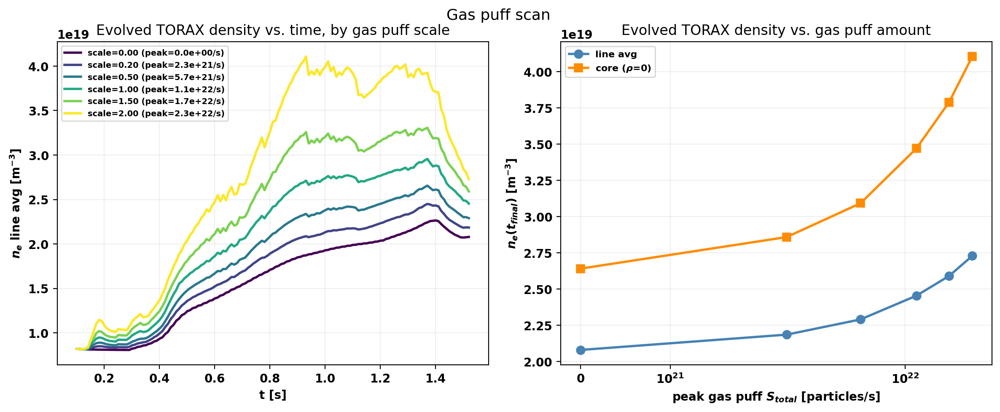

In [40]:
GAS_PUFF_SCALES = [0.0, 0.2, 0.5, 1.0, 1.5, 2.0]  # multiples of the measured gas_puff_S_total trace

# This scan needs density to actually respond to gas_puff_S_total, so it explicitly restores
# full kinetic evolution here regardless of FREEZE_KINETICS_TO_TRANSP above.
tmtx.set_evolve(density=True, Ti=True, Te=True, current=True)


def tx_scalar_series(data_tree, name, scale=1.0):
    '''Full-resolution (t, y) time series for a dt.scalars.<name> quantity, or (None, None).'''
    if not hasattr(data_tree.scalars, name):
        return None, None
    var = getattr(data_tree.scalars, name)
    return var.coords['time'].values, var.to_numpy() * scale

def tx_core_value(data_tree, var_name, time):
    '''TORAX's own <var_name> value at rho~0, nearest available time, native rho grid.'''
    da = getattr(data_tree.profiles, var_name).sel(time=time, method='nearest')
    for rho_coord in ('rho_cell_norm', 'rho_face_norm', 'rho_norm'):
        if rho_coord in da.coords:
            rho = da.coords[rho_coord].values
            return float(np.interp(0.0, rho, da.values))
    raise ValueError(f"{var_name!r} has no recognized rho coordinate - found: {list(da.coords)}")

gas_puff_scan_results = []
for scale in GAS_PUFF_SCALES:
    scaled_gas_puff = {t: scale * s for t, s in recycling['S_total'].items()}
    result = {'scale': scale, 'peak_gas_puff_S_total': max(scaled_gas_puff.values()), 'status': 'ok'}
    try:
        tmtx.set_fueling(gas_puff_S_total=scaled_gas_puff, gas_puff_decay_length=gas_puff_decay_length,
                          generic_particle_S_total=beam['S_total'],
                          generic_particle_location=sbe_loc,
                          generic_particle_width=sbe_width)
        tmtx.fly(output_mode=False, max_loop=3, run_name='tmp', relax=True, relax_kinetics=True, relax_duration=5 * tx_dt)

        dt_scan = tmtx._data_tree
        t_ne, ne_line_avg = tx_scalar_series(dt_scan, 'n_e_line_avg')
        result['t'] = t_ne
        result['n_e_line_avg'] = ne_line_avg
        result['n_e_line_avg_final'] = (float(ne_line_avg[np.argmin(np.abs(t_ne - t_final))])
                                          if t_ne is not None else float('nan'))
        result['n_e_core_final'] = tx_core_value(dt_scan, 'n_e', t_final)
        print(f"scale={scale:.2f}  peak gas_puff S_total={result['peak_gas_puff_S_total']:.3e} particles/s  "
              f"-> n_e_line_avg(t_final)={result['n_e_line_avg_final']:.3e} m^-3, "
              f"n_e_core(t_final)={result['n_e_core_final']:.3e} m^-3")
    except Exception as e:
        result['status'] = 'failed'
        result['error'] = f'{type(e).__name__}: {e}'
        result['t'] = None
        result['n_e_line_avg'] = None
        result['n_e_line_avg_final'] = float('nan')
        result['n_e_core_final'] = float('nan')
        print(f"scale={scale:.2f}  peak gas_puff S_total={result['peak_gas_puff_S_total']:.3e} particles/s  "
              f"-> FAILED: {result['error']}")
    gas_puff_scan_results.append(result)

n_failed = sum(1 for r in gas_puff_scan_results if r['status'] != 'ok')
if n_failed:
    print(f"\n{n_failed}/{len(gas_puff_scan_results)} scan point(s) failed to converge:")
    for r in gas_puff_scan_results:
        if r['status'] != 'ok':
            print(f"  scale={r['scale']:.2f}: {r['error']}")

# Restore the baseline (measured) gas puff amount so tmtx/dt reflect this notebook's actual
# configuration again, not the last scan point above - wrapped separately so a restore failure
# is reported clearly instead of silently leaving tmtx in a failed/last-scan-point state.
try:
    tmtx.set_fueling(gas_puff_S_total=recycling['S_total'], gas_puff_decay_length=gas_puff_decay_length,
                      generic_particle_S_total=beam['S_total'],
                      generic_particle_location=sbe_loc,
                      generic_particle_width=sbe_width)
    tmtx.fly(output_mode=False, max_loop=3, run_name='tmp', relax=True, relax_kinetics=True, relax_duration=5 * tx_dt)
    dt = tmtx._data_tree
    print('\nBaseline (measured) gas puff amount restored.')
except Exception as e:
    print(f'\nWARNING: failed to restore the baseline run after the scan: {type(e).__name__}: {e}')
    print('tmtx/dt may be left in a failed or last-scan-point state - rerun the tmtx.fly(...) cell '
          'above manually before using the Check cells.')

ok_results = [r for r in gas_puff_scan_results if r['status'] == 'ok']
colors = plt.cm.viridis(np.linspace(0, 1, len(GAS_PUFF_SCALES)))
scale_to_color = dict(zip(GAS_PUFF_SCALES, colors))

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

ax = axes[0]
for r in ok_results:
    ax.plot(r['t'], r['n_e_line_avg'], '-', color=scale_to_color[r['scale']],
            label=f"scale={r['scale']:.2f} (peak={r['peak_gas_puff_S_total']:.1e}/s)")
ax.set_xlabel('t [s]')
ax.set_ylabel(r'$n_e$ line avg [m$^{-3}$]')
ax.set_title('Evolved TORAX density vs. time, by gas puff scale')
ax.legend(fontsize=7)
ax.grid(alpha=0.2)

ax = axes[1]
peak_vals = [r['peak_gas_puff_S_total'] for r in ok_results]
ne_line_final_vals = [r['n_e_line_avg_final'] for r in ok_results]
ne_core_final_vals = [r['n_e_core_final'] for r in ok_results]
ax.plot(peak_vals, ne_line_final_vals, 'o-', color='steelblue', label='line avg')
ax.plot(peak_vals, ne_core_final_vals, 's-', color='darkorange', label=r'core ($\rho$=0)')
failed_scales = [r['scale'] for r in gas_puff_scan_results if r['status'] != 'ok']
if failed_scales:
    ax.text(0.02, 0.02, f'no data for scale={failed_scales}\n(sim did not converge)',
            transform=ax.transAxes, fontsize=7, color='crimson', va='bottom')
nonzero_peaks = [v for v in peak_vals if v > 0]
linthresh = min(nonzero_peaks) if nonzero_peaks else 1e19
ax.set_xscale('symlog', linthresh=linthresh)
ax.set_xlabel('peak gas puff $S_{total}$ [particles/s]')
ax.set_ylabel(r'$n_e(t_{final})$ [m$^{-3}$]')
ax.set_title('Evolved TORAX density vs. gas puff amount')
ax.legend(fontsize=8)
ax.grid(alpha=0.2)

fig.suptitle('Gas puff scan', fontsize=13)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()
